In [1]:
import pennylane as qml
from pennylane import numpy as np
import pickle


# My custom libraries
from CCQKAN import CCQKAN, evaluation as ev
from CCQKAN_datasets import datasets_utils as dt

# CCQKAN RESULTS

This notebook presents the results obtained from the 6 models proposed in this work, these are:
* **Plain-CHEB**
* **Plain-Flex**
* **GFCF-CHEB-0**
* **GFCF-CHEB-1**
* **GFCF-Flex-0**
* **GFCF-Flex-1**

– **Plain** models directly adapt the classical input to the QKAN input structure, whereas **GFCF** models also perform the GFCF transformation proposed in [2].  
– **CHEB** models use CHEB-QKAN [1] as quantum processing circuit. **Flex** models leverage Flex-QKAN introduced in this work.


In [4]:
model_names = ['Plain-CHEB', 'Plain-Flex', 'GFCF-CHEB-0', 'GFCF-CHEB-1', 'GFCF-Flex-0', 'GFCF-Flex-1']

**Three distinct tasks** were used to evaluate the feasibility of these architectures. To asses a proper comparison between the models and other state-of-the-art architectures, all three tasks have been evaluated by the same metrics shown in VQKAN [3], Adaptive VQKAN (AVQKAN) [4] and EVQKAN [5]. 

All tasks have been conducted **externally** to this notebook leveraging the computational resources of CSUC Pirineus III; its sole purpose is to present the results

## Tasks description

A total of **10 runs** have been conducted for each model per task. Each run used a **different training set**, but all runs were tested by means of the **same test set**. All training and test sets belonging to a same task, contain points generated according to the same distribution.

As for VQKAN, AVQKAN and EVQKAN, each test set contains **50 points**. While training sets contian different number of points depending on the task.
  
A short description of each task is given below:

#### Classification task (Classification)
Classification task inputs 2-Dimensional points sampled from $[0, 1]^2$.
Then, $x_0$ is transformed according to:
$f(x) = \exp(d_0 \sqrt{x_0} + d_1) + d_1 \sqrt{1 - d_3 \sqrt{x_0}^2} + \cos(d_4 \sqrt{x_0} + d_5) + \sin(d_6 \sqrt{x_0} + d_7)$.Then, $f(x)$ values are normalized to the interval $[0,1]$, obtaining an array $y\in[0,1]$. Finally, classification is performed according to:
$label =
\begin{cases}
-1 & \text{if } f \geq \sqrt{x_1} \\
1 & \text{if } f < \sqrt{x_1}
\end{cases}$.

The objective is to correctly classify as many test points as possible. As well as generating an empirical decision boundary as close as possible to $f(x)$ in terms of Sum of Absolute Distances (SAD) error.

#### Exponential Regression task (Exponential)

First regression task inputs 4-Dimensional points randomly sampled from $[-1,1]^4$ domain. Function:

$f^{\text{aim}}(\mathbf{x}) = \exp\left( \sin(x_0^2 + x_1^2) + \sin(x_1^2 + x_3^2) \right)$ 

is used to generate all synthetic datasets.

The objective is to generate predictions for the test points as close as possible to $f^{aim}(\mathbf{x}_{test})$ in terms of SAD error.

#### Polynomial Regression task (Polynomial)

Second regression task inputs 2-Dimensional points randomly sampled from $[-1,1]^2$ domain. Function:

$f^{\text{aim}}(\mathbf{x}) = x_0^2 + x_1^2$ 

is used to generate all synthetic datasets.

The objective is to generate predictions for the test points as close as possible to $f^{aim}(\mathbf{x}_{test})$ in terms of SAD error.

In [12]:
task_names = ['Classification', 'Exponential', 'Polynomial']

## Load files containing results

Tasks have been conducted externally, hence the first step is to load all result files.

### Classification

Trained in std partition, with 64gb of RAM (15:00 maximum time)

In [16]:
with open("results/classification/unidimensional_hyperplane/cheb_qkan_non.pkl", "rb") as f:
    classification_unidimensional_hyperplane_results_0 = pickle.load(f)
    
# Model to plot confusion matrices (dataests are normalized, therefore output range is always [0,1])
classification_unidimensional_hyperplane_model_0 = CCQKAN([1, 2, 1], 2, range_values=[0,1], range_values_output=[0,1], GFCF=False, eta=1, alpha=0.8, train_gfcf=False, train_angles=False)
classification_unidimensional_hyperplane_requirements_0 = ev.resources_from_config(classification_unidimensional_hyperplane_results_0['configuration'])

C:\Users\jgojg\anaconda3\Lib\site-packages\pennylane\workflow\qnode.py:135: UserWarning: Received gradient_kwarg wires, which is not included in the list of standard qnode gradient kwargs.
  warnings.warn(


In [17]:
with open("results/classification/unidimensional_hyperplane/cheb_qkan_yes.pkl", "rb") as f:
    classification_unidimensional_hyperplane_results_1 = pickle.load(f)

# Model to plot confusion matrices (dataests are normalized, therefore output range is always [0,1])
classification_unidimensional_hyperplane_model_1 = CCQKAN([1, 2, 1], 2, range_values=[0,1], range_values_output=[0,1], GFCF=False, eta=1, alpha=0.8, train_gfcf=False, train_angles=True)
classification_unidimensional_hyperplane_requirements_1 = ev.resources_from_config(classification_unidimensional_hyperplane_results_1['configuration'])

C:\Users\jgojg\anaconda3\Lib\site-packages\pennylane\workflow\qnode.py:135: UserWarning: Received gradient_kwarg wires, which is not included in the list of standard qnode gradient kwargs.
  warnings.warn(


In [18]:
with open("results/classification/unidimensional_hyperplane/gfcf_qkan_non_non.pkl", "rb") as f:
    classification_unidimensional_hyperplane_results_2 = pickle.load(f)

# Model to plot confusion matrices (dataests are normalized, therefore output range is always [0,1])
classification_unidimensional_hyperplane_model_2 = CCQKAN([1, 2, 1], 2, range_values=[0,1], range_values_output=[0,1], GFCF=True, eta=1, alpha=0.8, train_gfcf=False, train_angles=False)
classification_unidimensional_hyperplane_requirements_2 = ev.resources_from_config(classification_unidimensional_hyperplane_results_2['configuration'])

C:\Users\jgojg\anaconda3\Lib\site-packages\pennylane\workflow\qnode.py:135: UserWarning: Received gradient_kwarg wires, which is not included in the list of standard qnode gradient kwargs.
  warnings.warn(


In [19]:
with open("results/classification/unidimensional_hyperplane/gfcf_qkan_yes_non.pkl", "rb") as f:
    classification_unidimensional_hyperplane_results_3 = pickle.load(f)

# Model to plot confusion matrices (dataests are normalized, therefore output range is always [0,1])
classification_unidimensional_hyperplane_model_3 = CCQKAN([1, 2, 1], 2, range_values=[0,1], range_values_output=[0,1], GFCF=True, eta=1, alpha=0.8, train_gfcf=True, train_angles=False)
classification_unidimensional_hyperplane_requirements_3 = ev.resources_from_config(classification_unidimensional_hyperplane_results_3['configuration'])

C:\Users\jgojg\anaconda3\Lib\site-packages\pennylane\workflow\qnode.py:135: UserWarning: Received gradient_kwarg wires, which is not included in the list of standard qnode gradient kwargs.
  warnings.warn(


In [20]:
with open("results/classification/unidimensional_hyperplane/gfcf_qkan_non_yes.pkl", "rb") as f:
    classification_unidimensional_hyperplane_results_4 = pickle.load(f)

# Model to plot confusion matrices (dataests are normalized, therefore output range is always [0,1])
classification_unidimensional_hyperplane_model_4 = CCQKAN([1, 2, 1], 2, range_values=[0,1], range_values_output=[0,1], GFCF=True, eta=1, alpha=0.8, train_gfcf=False, train_angles=True)
classification_unidimensional_hyperplane_requirements_4 = ev.resources_from_config(classification_unidimensional_hyperplane_results_4['configuration'])

C:\Users\jgojg\anaconda3\Lib\site-packages\pennylane\workflow\qnode.py:135: UserWarning: Received gradient_kwarg wires, which is not included in the list of standard qnode gradient kwargs.
  warnings.warn(


In [21]:
with open("results/classification/unidimensional_hyperplane/gfcf_qkan_yes_yes.pkl", "rb") as f:
    classification_unidimensional_hyperplane_results_5 = pickle.load(f)

# Model to plot confusion matrices (dataests are normalized, therefore output range is always [0,1])
classification_unidimensional_hyperplane_model_5 = CCQKAN([1, 2, 1], 2, range_values=[0,1], range_values_output=[0,1], GFCF=True, eta=1, alpha=0.8, train_gfcf=True, train_angles=True)
classification_unidimensional_hyperplane_requirements_5 = ev.resources_from_config(classification_unidimensional_hyperplane_results_5['configuration'])

C:\Users\jgojg\anaconda3\Lib\site-packages\pennylane\workflow\qnode.py:135: UserWarning: Received gradient_kwarg wires, which is not included in the list of standard qnode gradient kwargs.
  warnings.warn(


### Exponential Regression

Trained in std partition, with 32gb of RAM (15:00 maximum time)

In [23]:
with open("results/regression/exponential/cheb_qkan_non.pkl", "rb") as f:
    regression_exponential_results_0 = pickle.load(f)
regression_exponential_requirements_0 = ev.resources_from_config(regression_exponential_results_0['configuration'])

In [24]:
with open("results/regression/exponential/cheb_qkan_yes.pkl", "rb") as f:
    regression_exponential_results_1 = pickle.load(f)
regression_exponential_requirements_1 = ev.resources_from_config(regression_exponential_results_1['configuration'])

In [25]:
with open("results/regression/exponential/gfcf_qkan_non_non.pkl", "rb") as f:
    regression_exponential_results_2 = pickle.load(f)
regression_exponential_requirements_2 = ev.resources_from_config(regression_exponential_results_2['configuration'])

In [26]:
with open("results/regression/exponential/gfcf_qkan_yes_non.pkl", "rb") as f:
    regression_exponential_results_3 = pickle.load(f)
regression_exponential_requirements_3 = ev.resources_from_config(regression_exponential_results_3['configuration'])

In [27]:
with open("results/regression/exponential/gfcf_qkan_non_yes.pkl", "rb") as f:
    regression_exponential_results_4 = pickle.load(f)
regression_exponential_requirements_4 = ev.resources_from_config(regression_exponential_results_4['configuration'])

In [28]:
with open("results/regression/exponential/gfcf_qkan_yes_yes.pkl", "rb") as f:
    regression_exponential_results_5 = pickle.load(f)
regression_exponential_requirements_5 = ev.resources_from_config(regression_exponential_results_5['configuration'])

### Polynomial Regression

Trained in std partition, with 32gb of RAM (15:00 maximum time)

In [30]:
with open("results/regression/polynomial/cheb_qkan_non.pkl", "rb") as f:
    regression_polynomial_results_0 = pickle.load(f)
regression_polynomial_requirements_0 = ev.resources_from_config(regression_polynomial_results_0['configuration'])

In [31]:
with open("results/regression/polynomial/cheb_qkan_yes.pkl", "rb") as f:
    regression_polynomial_results_1 = pickle.load(f)
regression_polynomial_requirements_1 = ev.resources_from_config(regression_polynomial_results_1['configuration'])

In [32]:
with open("results/regression/polynomial/gfcf_qkan_non_non.pkl", "rb") as f:
    regression_polynomial_results_2 = pickle.load(f)
regression_polynomial_requirements_2 = ev.resources_from_config(regression_polynomial_results_2['configuration'])

In [33]:
with open("results/regression/polynomial/gfcf_qkan_yes_non.pkl", "rb") as f:
    regression_polynomial_results_3 = pickle.load(f)
regression_polynomial_requirements_3 = ev.resources_from_config(regression_polynomial_results_3['configuration'])

In [34]:
with open("results/regression/polynomial/gfcf_qkan_non_yes.pkl", "rb") as f:
    regression_polynomial_results_4 = pickle.load(f)
regression_polynomial_requirements_4 = ev.resources_from_config(regression_polynomial_results_4['configuration'])

In [35]:
with open("results/regression/polynomial/gfcf_qkan_yes_yes.pkl", "rb") as f:
    regression_polynomial_results_5 = pickle.load(f)
regression_polynomial_requirements_5 = ev.resources_from_config(regression_polynomial_results_5['configuration'])

## Dataset Visualization

Datasets for the same task have been generated according to the same distribution. Therefore, only test datasets are shown.

### Classification 

Classification task utilizes:
* **Test size:** 50 points
* **Training size:** 45 points for each task

**Test dataset visualization**

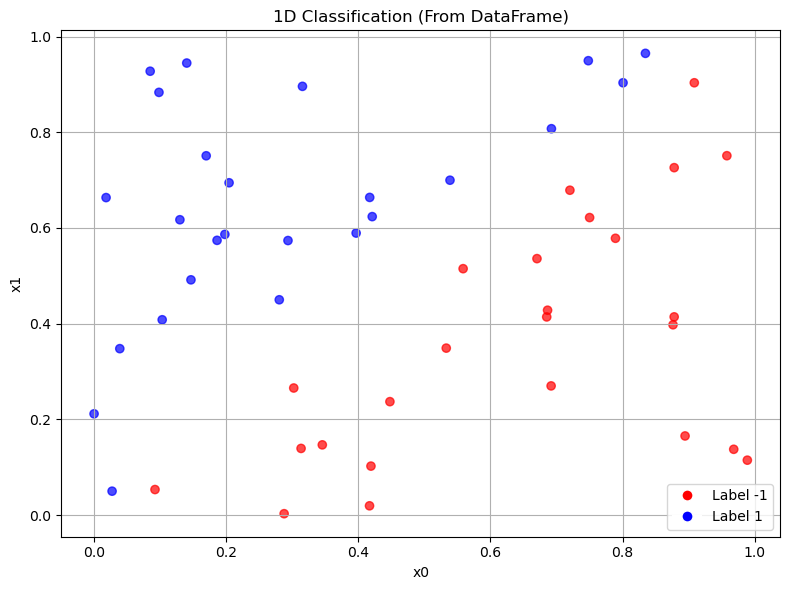

In [41]:
dt.plot_classification_unidimensional(classification_unidimensional_hyperplane_results_0['test_data'][0])

### Exponential

Exponential task utilizes:
* **Test size:** 50 points
* **Training size:** 50 points for each task

**Test dataset visualization**

In [49]:
regression_exponential_results_0['test_data'][0].head()

,x0,x1,x2,x3,y
0,0.097627,0.140394,0.355633,-0.701103,1.837968
1,0.430379,-0.122797,-0.459984,0.736252,2.418808
2,0.205527,0.976748,0.470388,-0.675014,4.331181
3,0.089766,-0.795910,0.924377,0.231119,4.001340
4,-0.152690,-0.582246,-0.502494,-0.752360,2.958263


To contextualize evaluation metrics (distance based), target bounds are needed.

In [53]:
y_vals = regression_exponential_results_0['test_data'][0].y
print(f"Target bounds are: [{y_vals.min()}, {y_vals.max()}]")

Target bounds are: [1.082823623431783, 7.1791761205245]


### Polynomial

Polynomial task utilizes:
* **Test size:** 50 points
* **Training size:** 100 points for each task

**Test dataset visualization**

In [66]:
dt.plot_regression_dataset(regression_polynomial_results_0['test_data'][0], 2, renderer='notebook')

In [70]:
y_vals = regression_polynomial_results_0['test_data'][0].y
print(f"Target bounds are: [{y_vals.min()}, {y_vals.max()}]")

Target bounds are: [0.029241378971053805, 1.824356557289962]


## Evaluation

This section presents all obtained metrics for every of the 6 models tested in the 3 tasks.

Metrics comparable to VQKAN, AVQKAN and EVQKAN are:
* **Evolution of training loss** -> This work uses MSE but Hikaru et.al. use a weighted sum of absolute distances.
* **Statistics of the sum of absolute distances for the test datasets across attempts** -> Main evaluation metric. Average, median, minimum, maximum and standard deviation is calculated across the 10 attempts.
* **Absolute distances error distribution for test points across attempts in log10** -> Vertical lines show the distribution of test points across the 10 attempts, mean and median lines are also plotted.

Proposed metrics are:
* **Classification accuracies** -> Accuracies of each attempt and mean accuracy across the 10 attempts are shown.
* **Classification precision** -> Precision of each attempt and mean precision across the 10 attempts are shown.
* **Classification recall** -> Recall of each attempt and mean recall across the 10 attempts are shown.
* **Classification confusion matrix** -> Confusion matrix for each attempt is shown.
* **True vs predicted plot** -> For polynomial task. (Attempt with less test error is shown).
* **Boxplots of training time per attempt** -> Training time per attempt for each model in a particular task is summarized within a boxplot.
* **Total training time** ->  Total training time for each model and task is shown.
* **Average training time per attempt for each model and task** -> Shown in heatmap form at the end of the document.

### Task 1: Classification

#### Model 1: Plain-CHEB

**Evolution of (MSE) training loss**

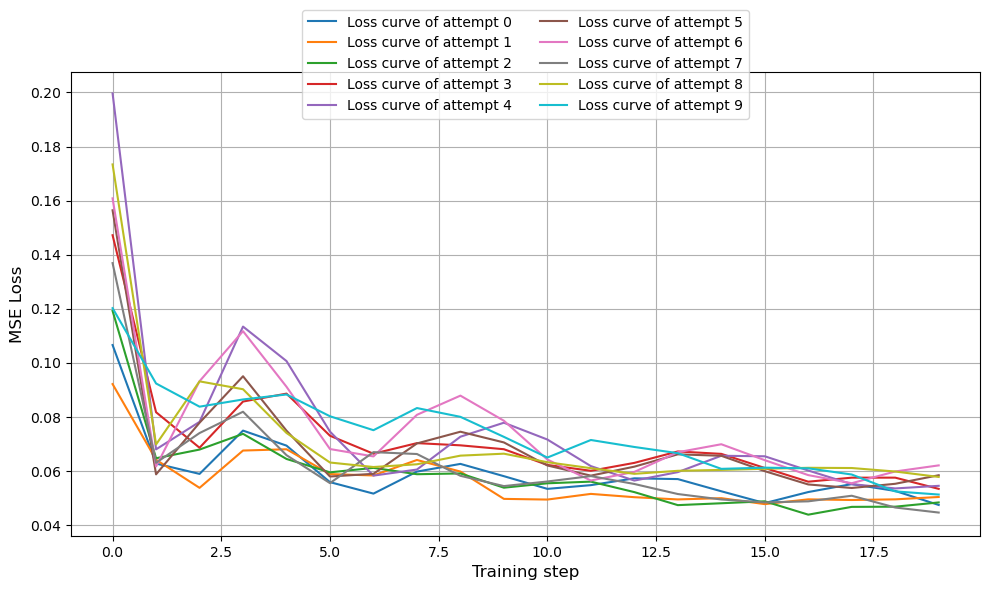

In [80]:
ev.plot_training_loss_curves(classification_unidimensional_hyperplane_results_0['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric for comparing with Hikaru et.al. [3] models)**

In [84]:
ev.summarize_test_errors(classification_unidimensional_hyperplane_results_0['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,9.773427073189788
median,9.878069838231811
min,8.073319199058679
max,11.283897176675323
std,1.0043446165599361


**Absolute distances error (log 10) distribution for test points across attempts**

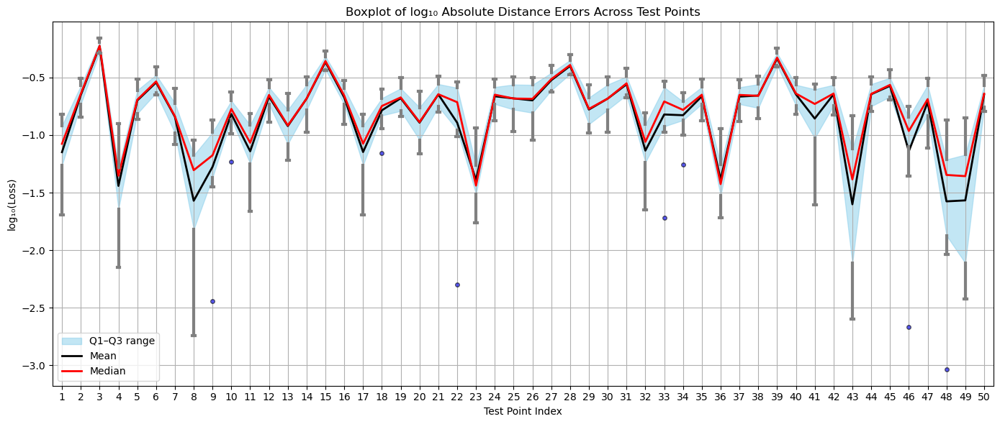

In [86]:
ev.plot_test_error_distribution(classification_unidimensional_hyperplane_results_0['local_test_errors'])

**Classification Confusion Matrices and metrics accross attempts**

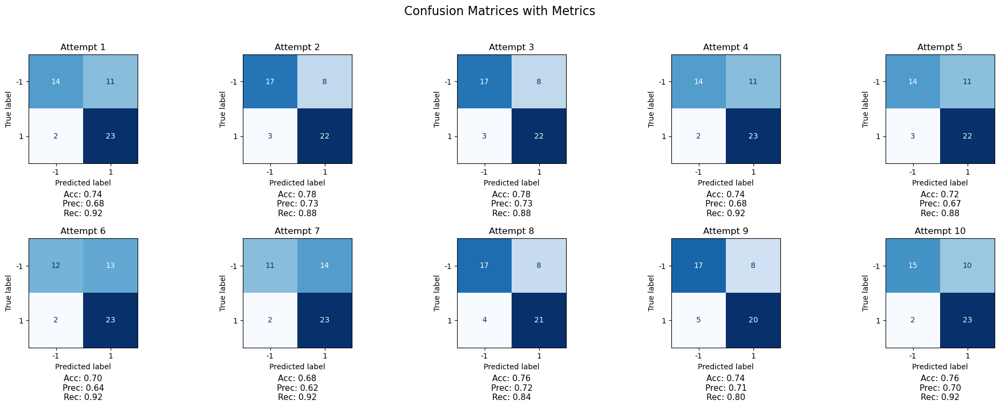

In [93]:
classification_metrics_0 = ev.metrics_classification(classification_unidimensional_hyperplane_results_0['test_data'], classification_unidimensional_hyperplane_model_0, classification_unidimensional_hyperplane_results_0['parameters_post_train'], show_confusion=True, show_barplot=False)

#### Model 2: Plain-Flex

**Evolution of (MSE) training loss**

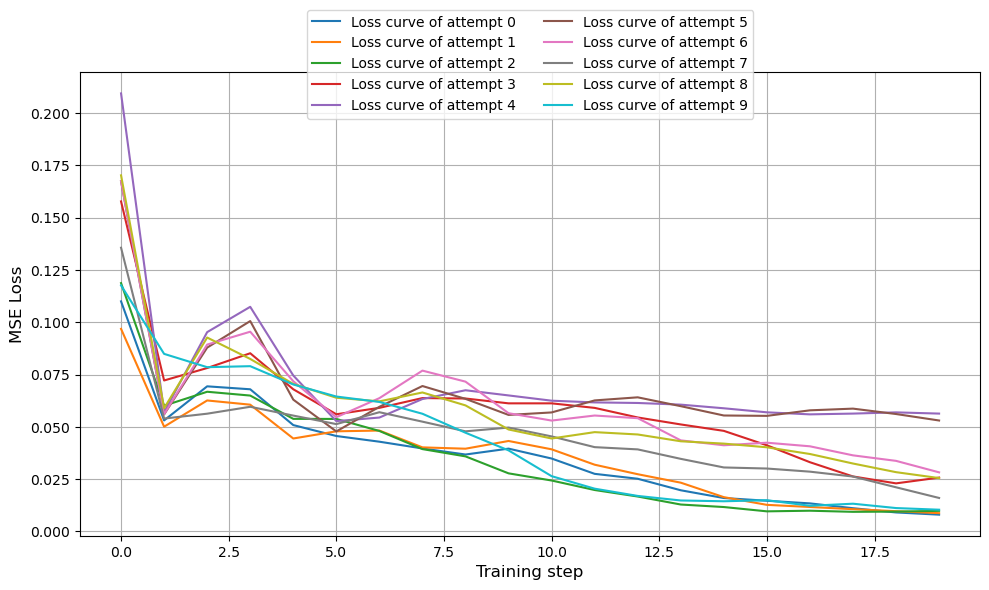

In [96]:
ev.plot_training_loss_curves(classification_unidimensional_hyperplane_results_1['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [98]:
ev.summarize_test_errors(classification_unidimensional_hyperplane_results_1['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,5.932647268668926
median,5.133984120670003
min,3.764164213375901
max,10.477554127478239
std,2.3799106262118945


**Absolute distances error distribution for test points across attempts**

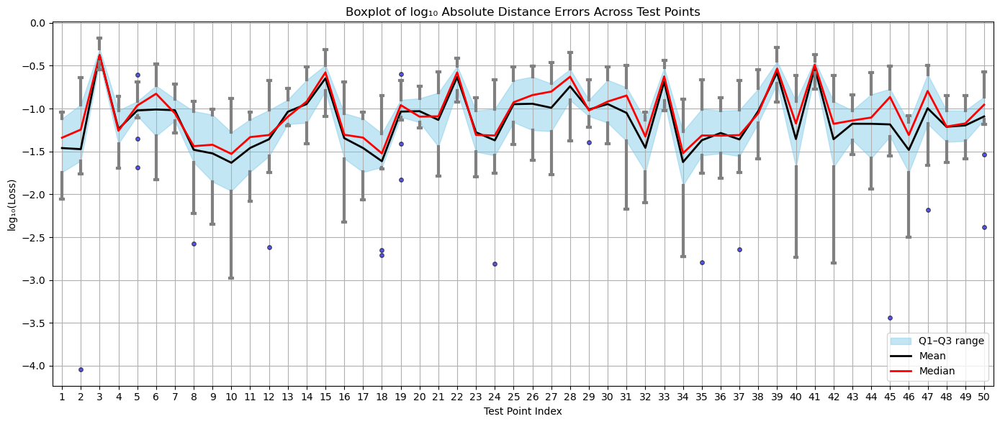

In [100]:
ev.plot_test_error_distribution(classification_unidimensional_hyperplane_results_1['local_test_errors'])

**Classification confusion Matrices and metrics accross attempts**

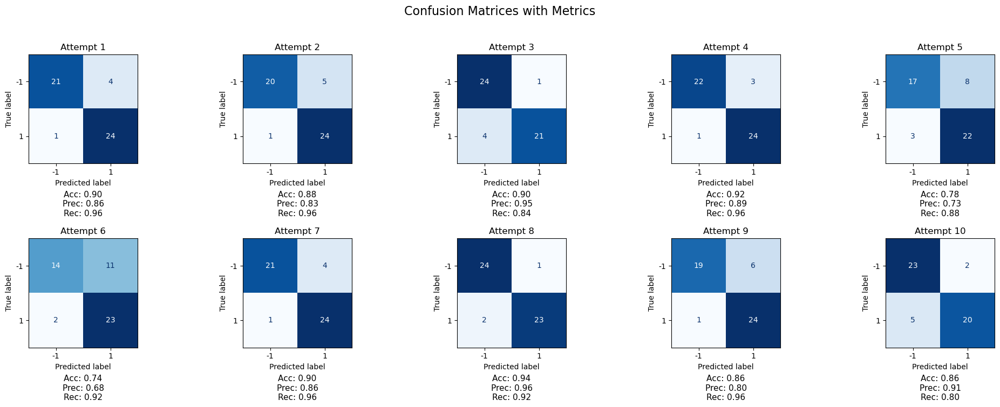

In [103]:
classification_metrics_1 = ev.metrics_classification(classification_unidimensional_hyperplane_results_1['test_data'], classification_unidimensional_hyperplane_model_1, classification_unidimensional_hyperplane_results_1['parameters_post_train'], show_confusion=True, show_barplot=False)

#### Model 3: GFCF-CHEB-0

**Evolution of (MSE) training loss**

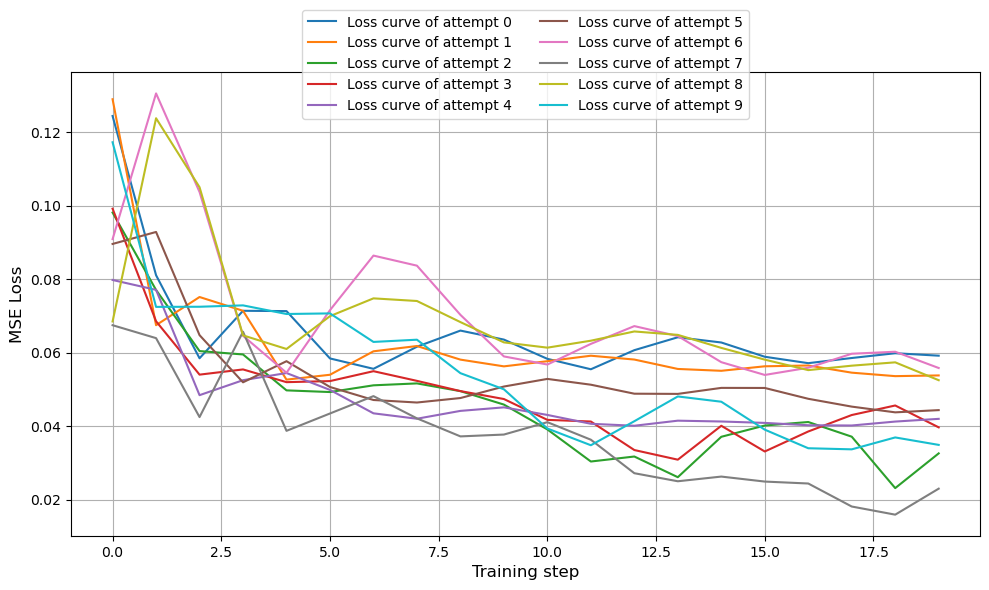

In [106]:
ev.plot_training_loss_curves(classification_unidimensional_hyperplane_results_2['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [108]:
ev.summarize_test_errors(classification_unidimensional_hyperplane_results_2['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,8.757390882581799
median,8.632255282697674
min,6.759427822087546
max,10.468552073159225
std,1.233157833489287


**Absolute distances error distribution for test points across attempts**

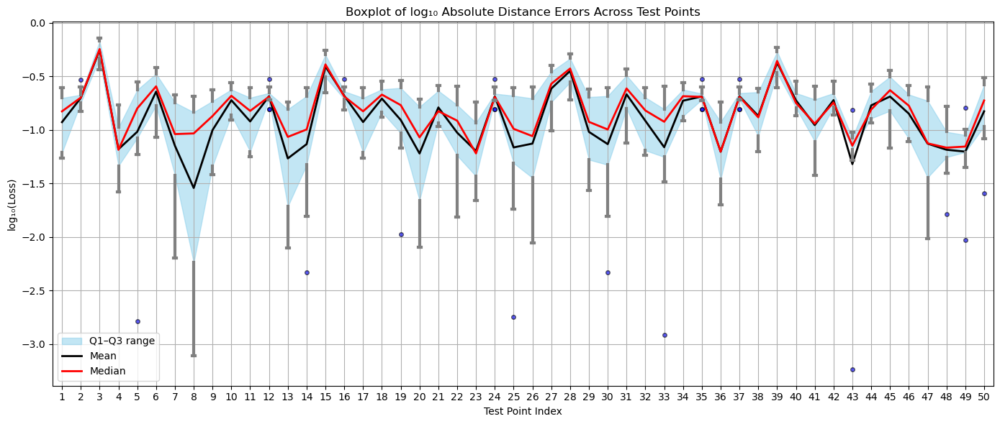

In [110]:
ev.plot_test_error_distribution(classification_unidimensional_hyperplane_results_2['local_test_errors'])

**Classification confusion Matrices and metrics accross attempts**

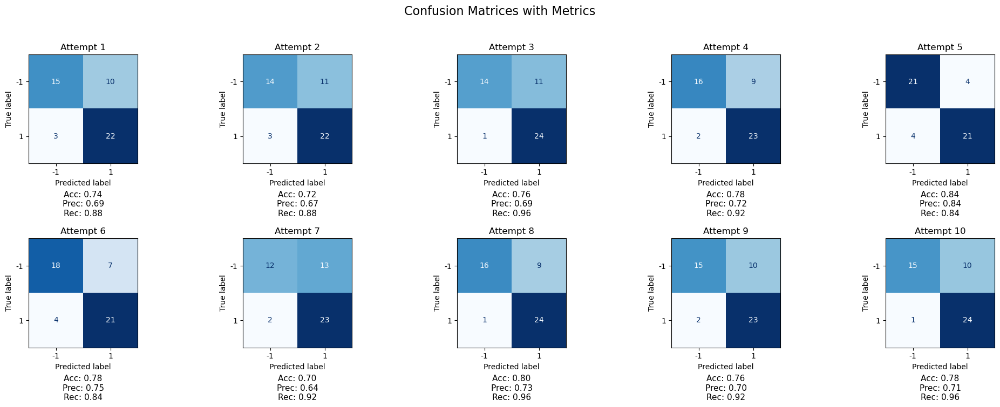

In [112]:
classification_metrics_2 = ev.metrics_classification(classification_unidimensional_hyperplane_results_2['test_data'], classification_unidimensional_hyperplane_model_2, classification_unidimensional_hyperplane_results_2['parameters_post_train'], show_confusion=True, show_barplot=False)

#### Model 4: GFCF-CHEB-1

**Evolution of (MSE) training loss**

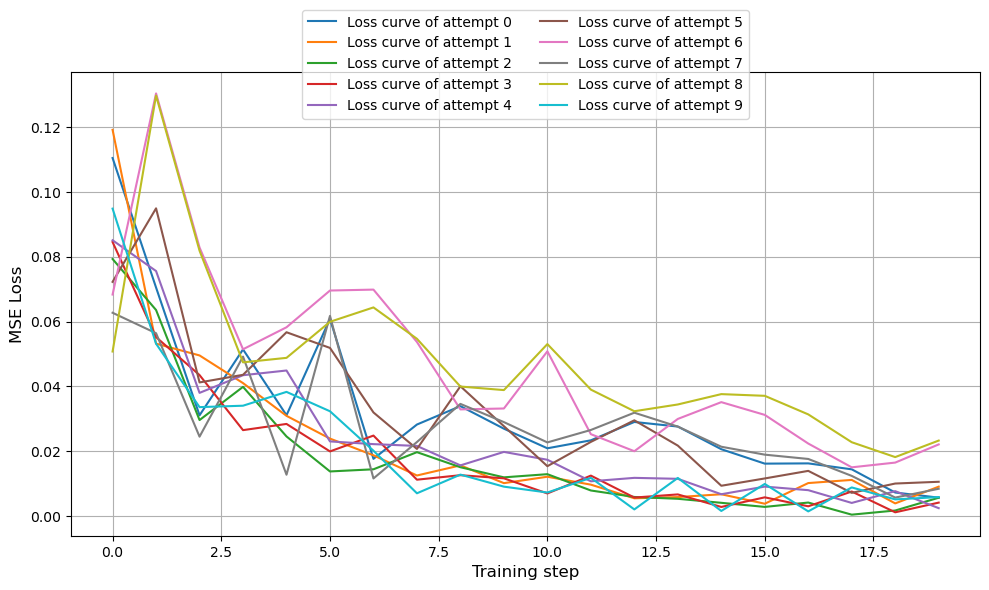

In [116]:
ev.plot_training_loss_curves(classification_unidimensional_hyperplane_results_3['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [118]:
ev.summarize_test_errors(classification_unidimensional_hyperplane_results_3['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,4.159948010262909
median,4.2837567125630045
min,1.8640475247116945
max,6.088971201761123
std,1.5002069729696272


**Absolute distances error distribution for test points across attempts**

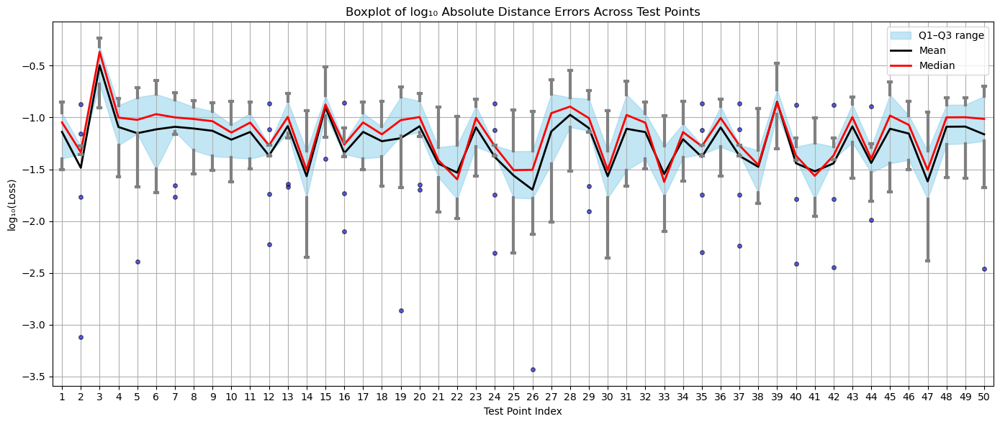

In [120]:
ev.plot_test_error_distribution(classification_unidimensional_hyperplane_results_3['local_test_errors'])

**Classification confusion Matrices and metrics accross attempts**

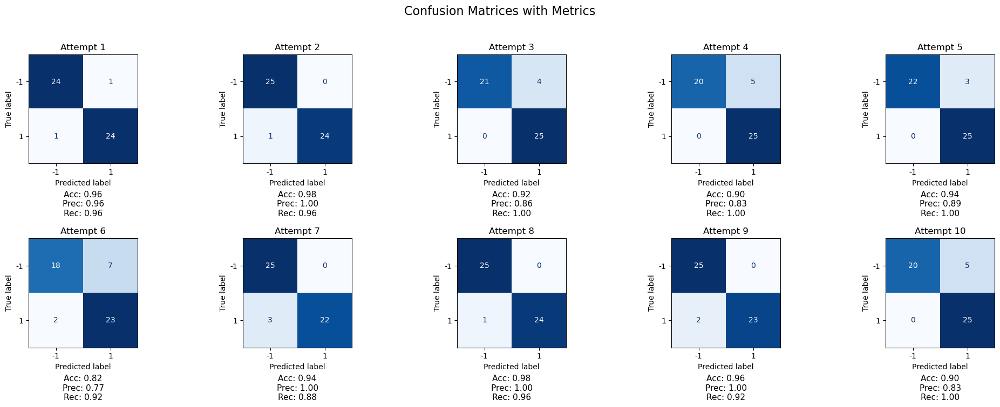

In [123]:
classification_metrics_3 = ev.metrics_classification(classification_unidimensional_hyperplane_results_3['test_data'], classification_unidimensional_hyperplane_model_3, classification_unidimensional_hyperplane_results_3['parameters_post_train'], show_confusion=True, show_barplot=False)

#### Model 5: GFCF-Flex-0

**Evolution of (MSE) training loss**

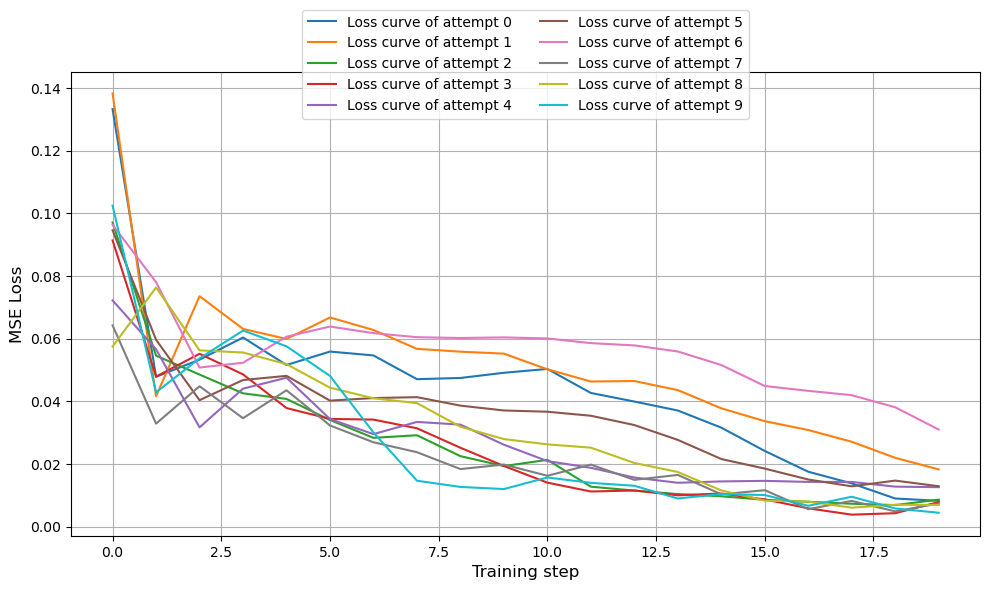

In [126]:
ev.plot_training_loss_curves(classification_unidimensional_hyperplane_results_4['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [128]:
ev.summarize_test_errors(classification_unidimensional_hyperplane_results_4['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,4.207823461345033
median,4.057825717019335
min,2.9465033179253437
max,6.476074849550992
std,1.1590478295586946


**Absolute distances error distribution for test points across attempts**

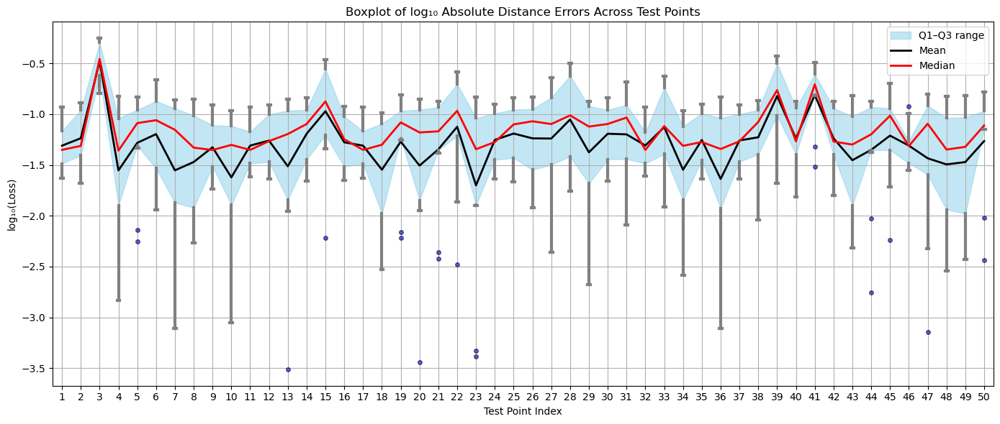

In [130]:
ev.plot_test_error_distribution(classification_unidimensional_hyperplane_results_4['local_test_errors'])

**Classification confusion Matrices and metrics accross attempts**

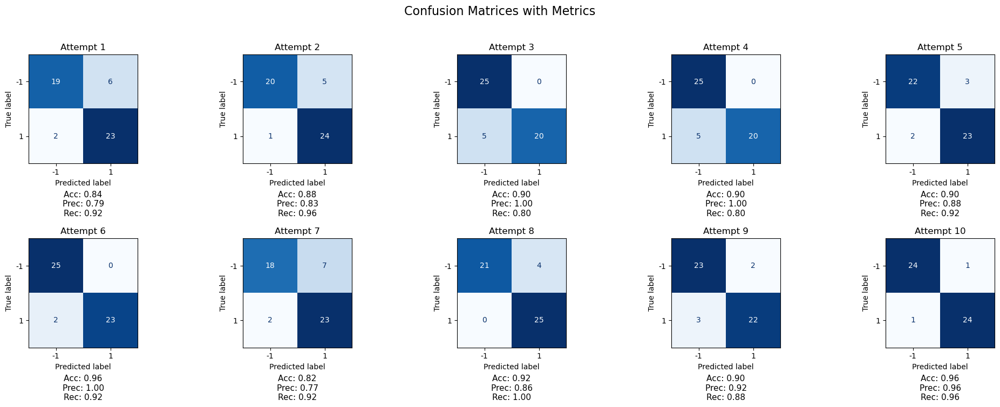

In [133]:
classification_metrics_4 = ev.metrics_classification(classification_unidimensional_hyperplane_results_4['test_data'], classification_unidimensional_hyperplane_model_4, classification_unidimensional_hyperplane_results_4['parameters_post_train'], show_confusion=True, show_barplot=False)

#### Model 6: GFCF-Flex-1

**Evolution of (MSE) training loss**

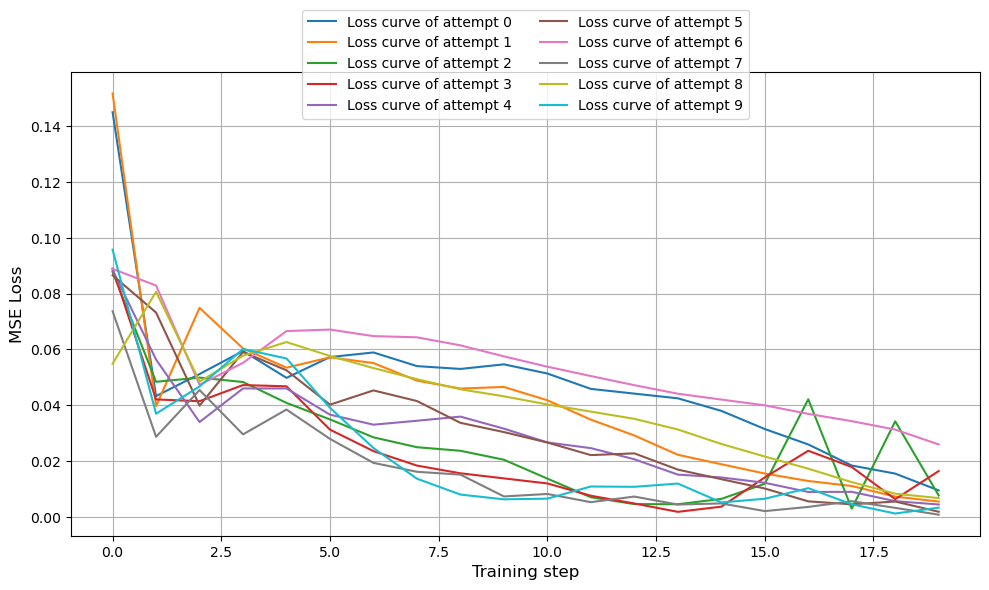

In [136]:
ev.plot_training_loss_curves(classification_unidimensional_hyperplane_results_5['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [138]:
ev.summarize_test_errors(classification_unidimensional_hyperplane_results_5['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,4.0524093052433425
median,4.03513707360246
min,2.5333470280793997
max,5.788660332975578
std,1.0618392759235713


**Absolute distances error distribution for test points across attempts**

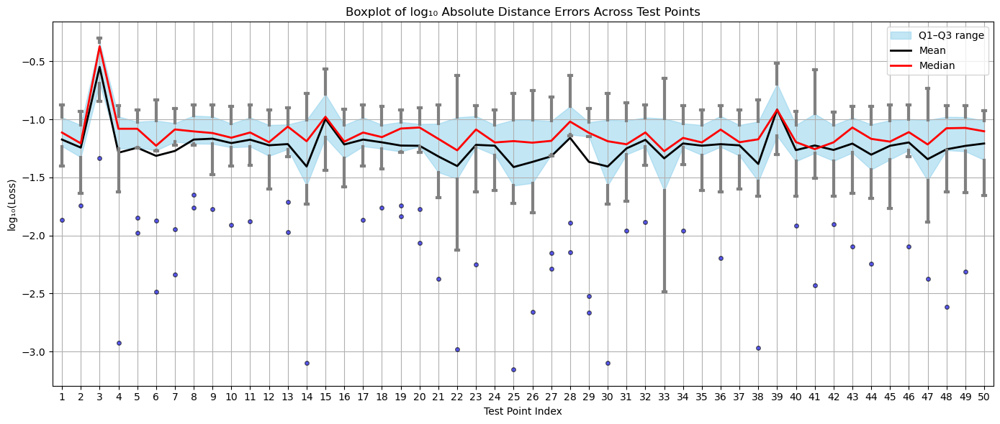

In [140]:
ev.plot_test_error_distribution(classification_unidimensional_hyperplane_results_5['local_test_errors'])

**Classification confusion Matrices and metrics accross attempts**

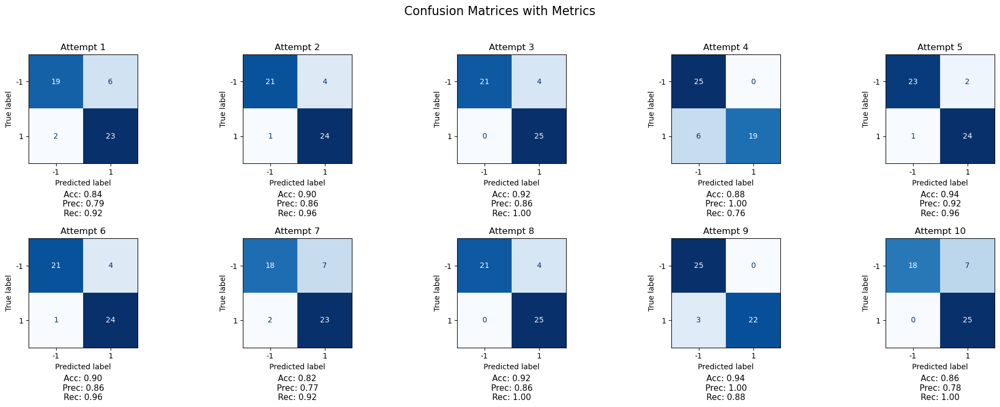

In [147]:
classification_metrics_5 = ev.metrics_classification(classification_unidimensional_hyperplane_results_5['test_data'], classification_unidimensional_hyperplane_model_5, classification_unidimensional_hyperplane_results_5['parameters_post_train'], show_confusion=True, show_barplot=False)

#### Classification results - Summary

In [149]:
test_error_lists_classification = [
    classification_unidimensional_hyperplane_results_0['global_test_errors'],
    classification_unidimensional_hyperplane_results_1['global_test_errors'],
    classification_unidimensional_hyperplane_results_2['global_test_errors'],
    classification_unidimensional_hyperplane_results_3['global_test_errors'],
    classification_unidimensional_hyperplane_results_4['global_test_errors'],
    classification_unidimensional_hyperplane_results_5['global_test_errors'],
]

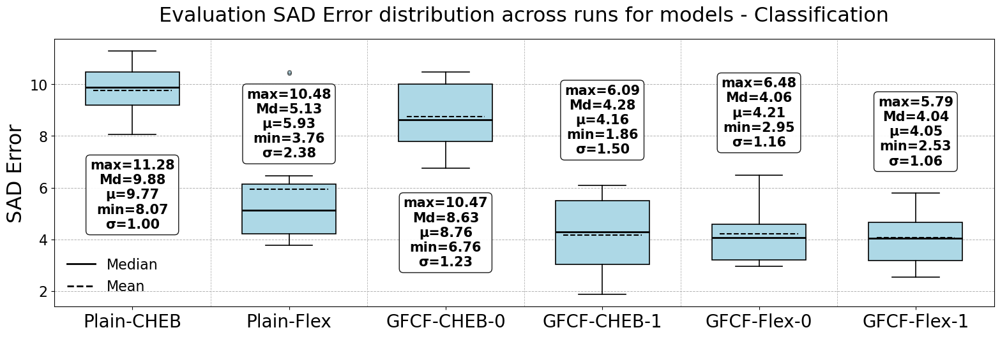

In [150]:
ev.plot_error_summary(test_error_lists_classification, model_names, 'classification', y_label="SAD Error", title="Evaluation SAD Error distribution across runs for models - Classification", output_path="classification_test_error_distro.pdf")

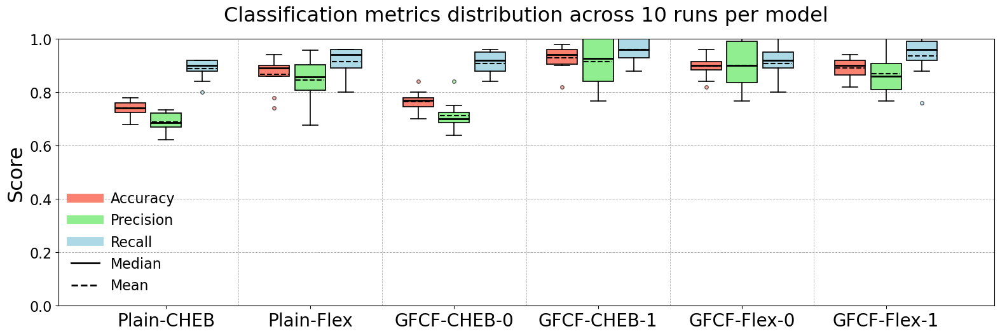

In [151]:
ev.summary_classification_metrics(
    classification_metrics_0,
    classification_metrics_1,
    classification_metrics_2,
    classification_metrics_3,
    classification_metrics_4,
    classification_metrics_5,
    model_names=model_names,
    title= "Classification metrics distribution across 10 runs per model"
)

In [152]:
'''
classification_metrics_all = [
    classification_metrics_0,
    classification_metrics_1,
    classification_metrics_2,
    classification_metrics_3,
    classification_metrics_4,
    classification_metrics_5,
]

with open("classification_metrics.pkl", "wb") as f:
    pickle.dump(classification_metrics_all, f)
'''

'\nclassification_metrics_all = [\n    classification_metrics_0,\n    classification_metrics_1,\n    classification_metrics_2,\n    classification_metrics_3,\n    classification_metrics_4,\n    classification_metrics_5,\n]\n\nwith open("classification_metrics.pkl", "wb") as f:\n    pickle.dump(classification_metrics_all, f)\n'

#### Classification Training Time statistics

**Model's training time per attempt**

In [155]:
classification_attempt_times_per_model = []
for i in range(len(model_names)):
    var_name = f"classification_unidimensional_hyperplane_results_{i}"
    results = globals()[var_name]['time_per_attempt']
    classification_attempt_times_per_model.append(results)

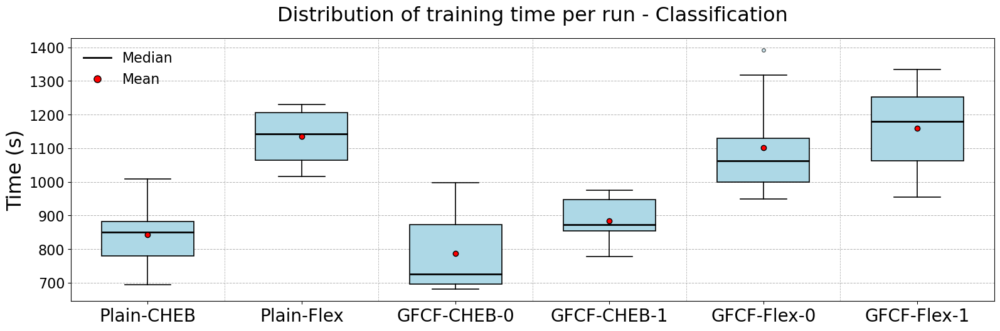

,Mean,Median,Std,Min,Max
Model,,,,,
GFCF-CHEB-0,787.74,725.47,122.30,681.04,997.26
GFCF-CHEB-1,884.34,872.67,70.30,778.78,975.47
GFCF-Flex-0,1101.39,1062.50,145.79,949.73,1391.35
GFCF-Flex-1,1159.69,1180.27,135.00,955.32,1334.98
Plain-CHEB,843.63,850.74,92.69,693.76,1008.10
Plain-Flex,1136.16,1143.17,82.29,1016.24,1230.41


In [156]:
ev.plot_training_time_boxplots(classification_attempt_times_per_model, model_names, title='Distribution of training time per run - Classification', y_label='Time (s)', output_path="classification_training_time_summary.pdf", show_stats=True)

**Total Training time per model**

In [158]:
classification_total_training_times = ev.summarize_total_training_time(classification_attempt_times_per_model, model_names)

Model,Total Training Time (s)
Plain-CHEB,8436.310000
Plain-Flex,11361.640000
GFCF-CHEB-0,7877.440000
GFCF-CHEB-1,8843.370000
GFCF-Flex-0,11013.910000
GFCF-Flex-1,11596.910000


### Task 2: Exponential Regression

#### Model 1: Plain-CHEB

**Evolution of (MSE) training loss**

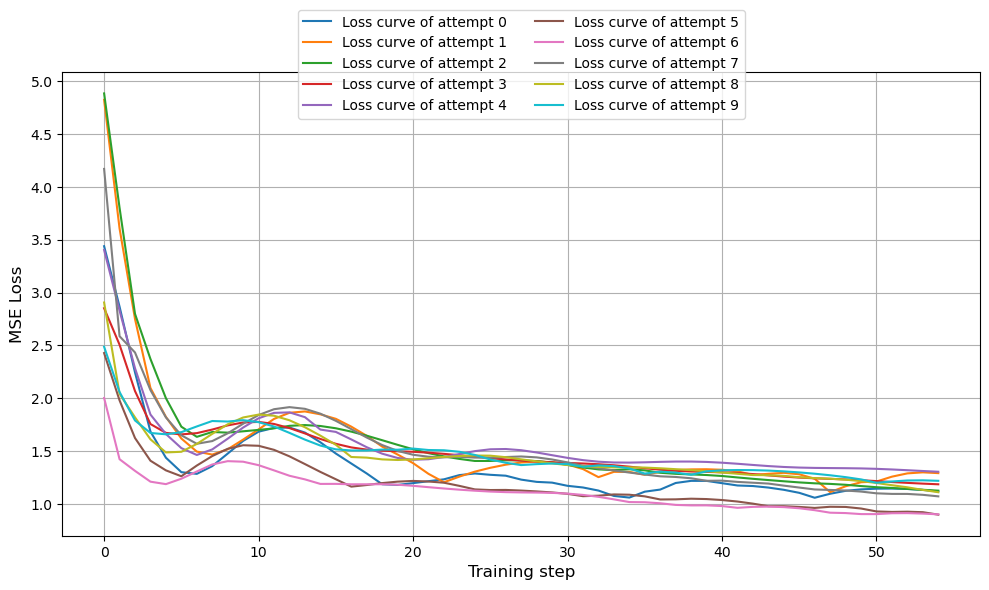

In [167]:
ev.plot_training_loss_curves(regression_exponential_results_0['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [169]:
ev.summarize_test_errors(regression_exponential_results_0['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,47.11927523553907
median,47.90152168959038
min,42.27937651551664
max,53.47939272318426
std,3.501716335643002


**Absolute distances error distribution for test points across attempts**

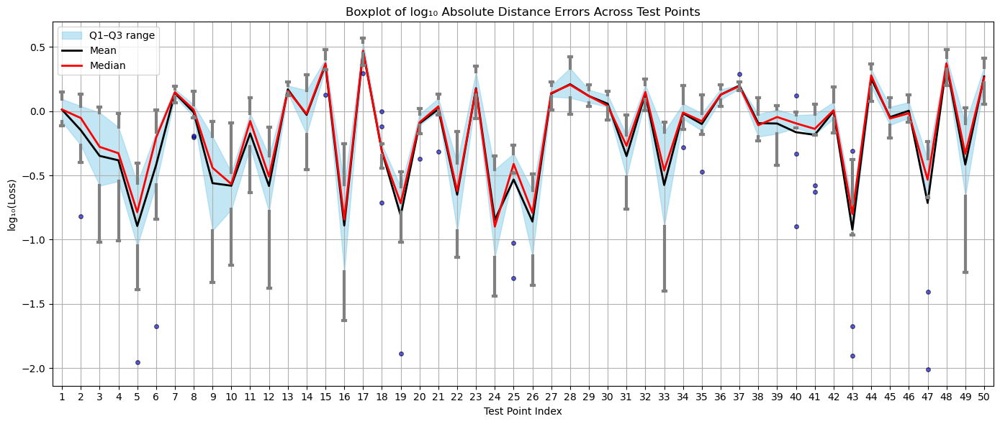

In [171]:
ev.plot_test_error_distribution(regression_exponential_results_0['local_test_errors'])

#### Model 2: Plain-Flex

**Evolution of (MSE) training loss**

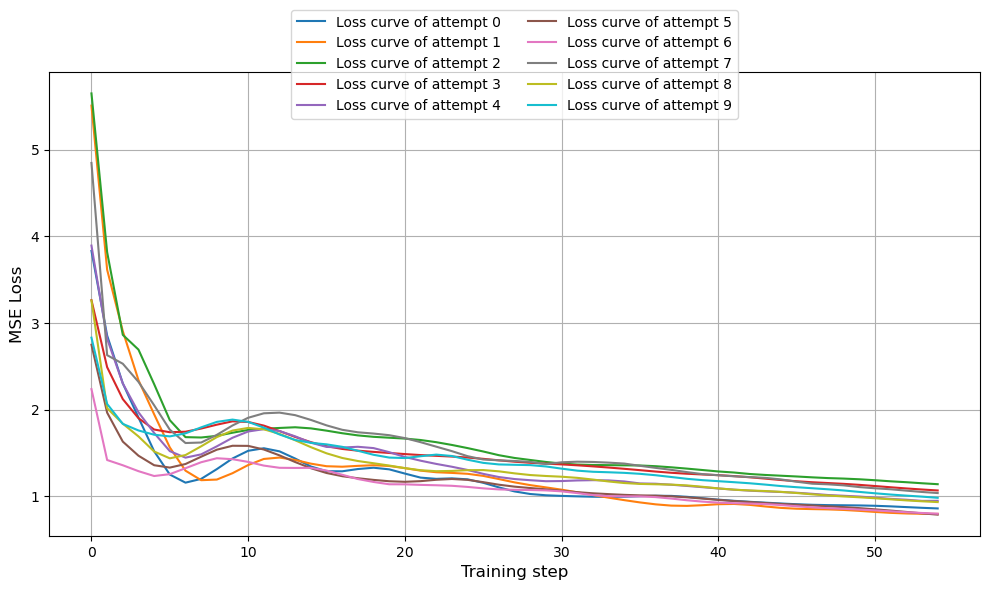

In [174]:
ev.plot_training_loss_curves(regression_exponential_results_1['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [176]:
ev.summarize_test_errors(regression_exponential_results_1['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,43.30839365671367
median,43.01088151616598
min,39.8649623650855
max,48.211240445093665
std,2.5437007597799357


**Absolute distances error distribution for test points across attempts**

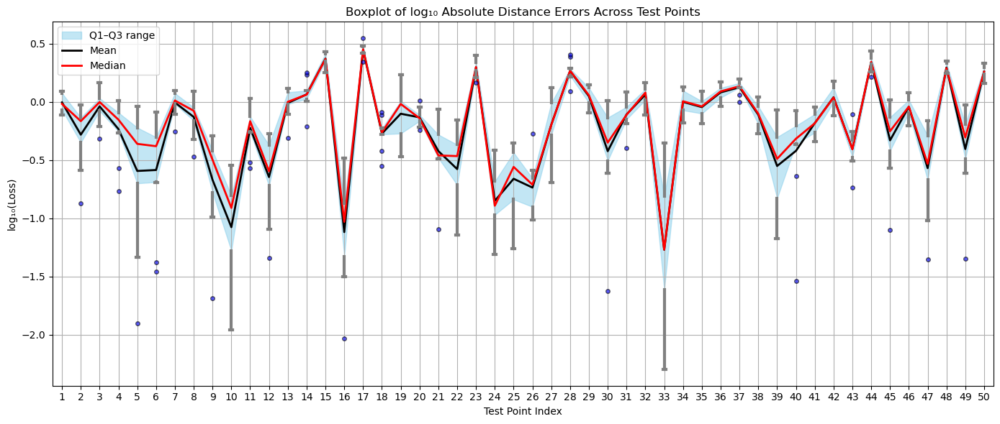

In [178]:
ev.plot_test_error_distribution(regression_exponential_results_1['local_test_errors'])

#### Model 3: GFCF-CHEB-0

**Evolution of (MSE) training loss**

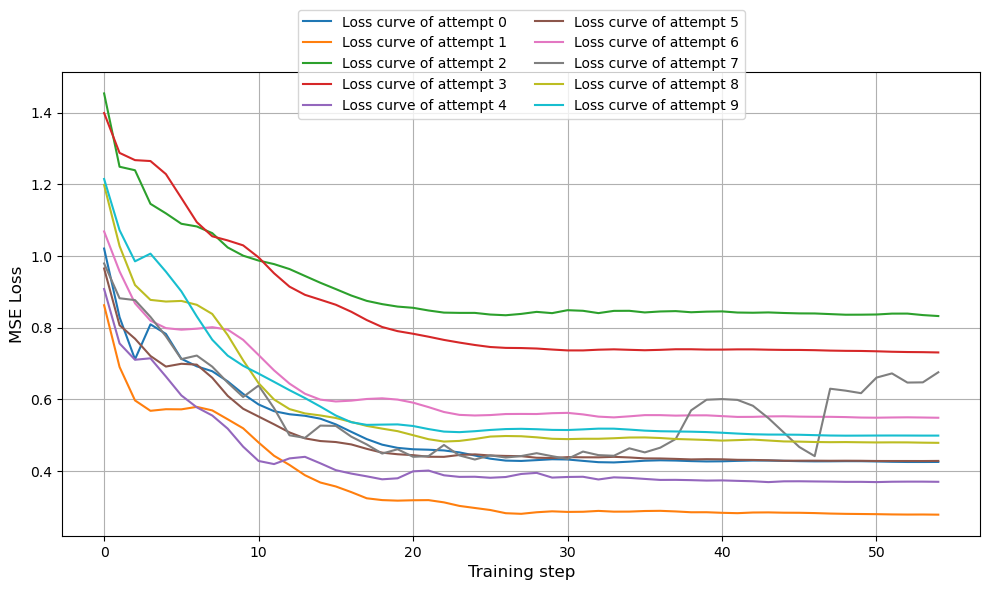

In [181]:
ev.plot_training_loss_curves(regression_exponential_results_2['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [183]:
ev.summarize_test_errors(regression_exponential_results_2['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,32.607045740756796
median,31.652192763761033
min,26.251552878569512
max,44.201629090665094
std,5.399632780977886


**Absolute distances error distribution for test points across attempts**

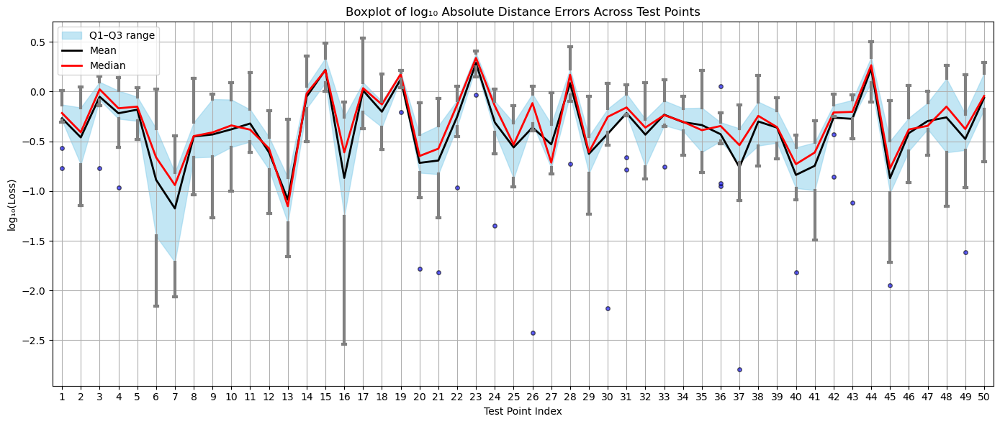

In [185]:
ev.plot_test_error_distribution(regression_exponential_results_2['local_test_errors'])

#### Model 4: GFCF-CHEB-1

**Evolution of (MSE) training loss**

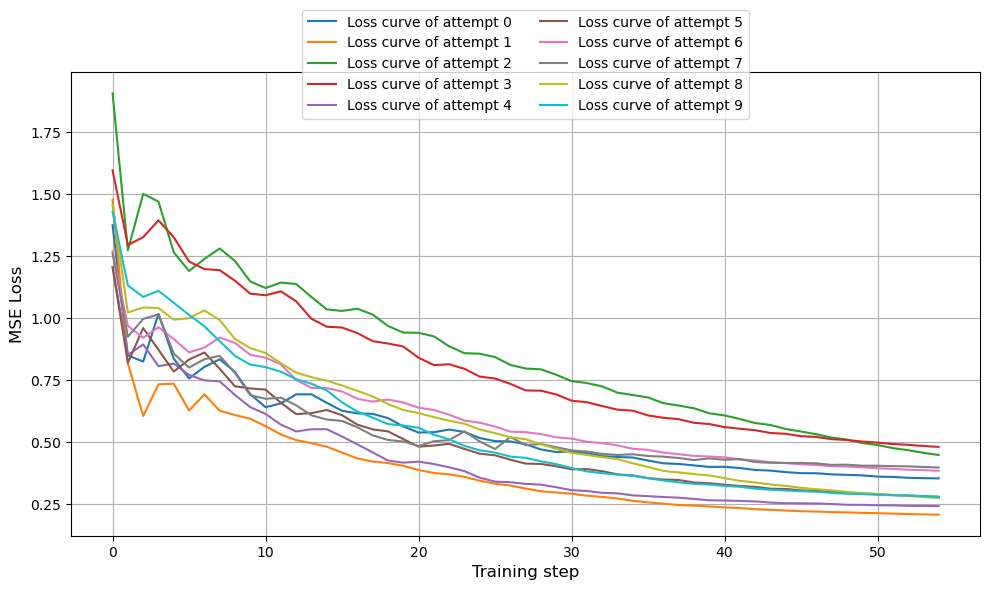

In [188]:
ev.plot_training_loss_curves(regression_exponential_results_3['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [190]:
ev.summarize_test_errors(regression_exponential_results_3['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,25.947983408897773
median,26.917042111336603
min,20.894981567115494
max,31.4954336068368
std,3.415061649321496


**Absolute distances error distribution for test points across attempts**

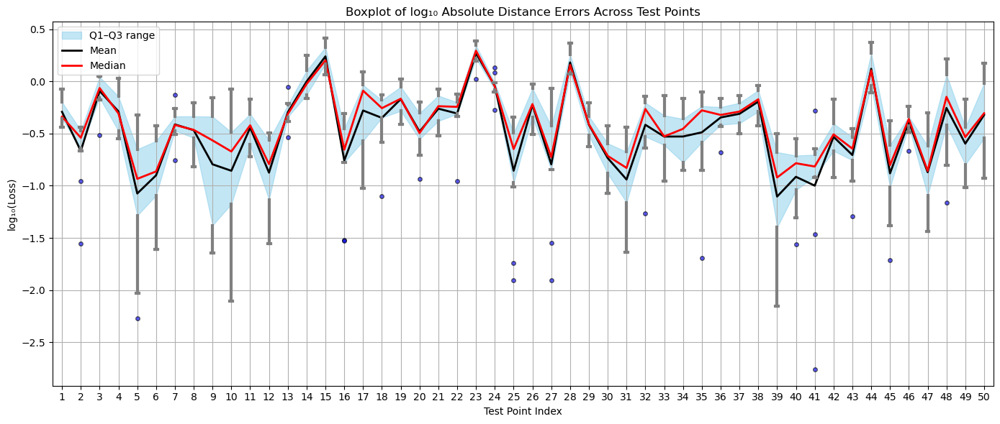

In [192]:
ev.plot_test_error_distribution(regression_exponential_results_3['local_test_errors'])

#### Model 5: GFCF-Flex-0

**Evolution of (MSE) training loss**

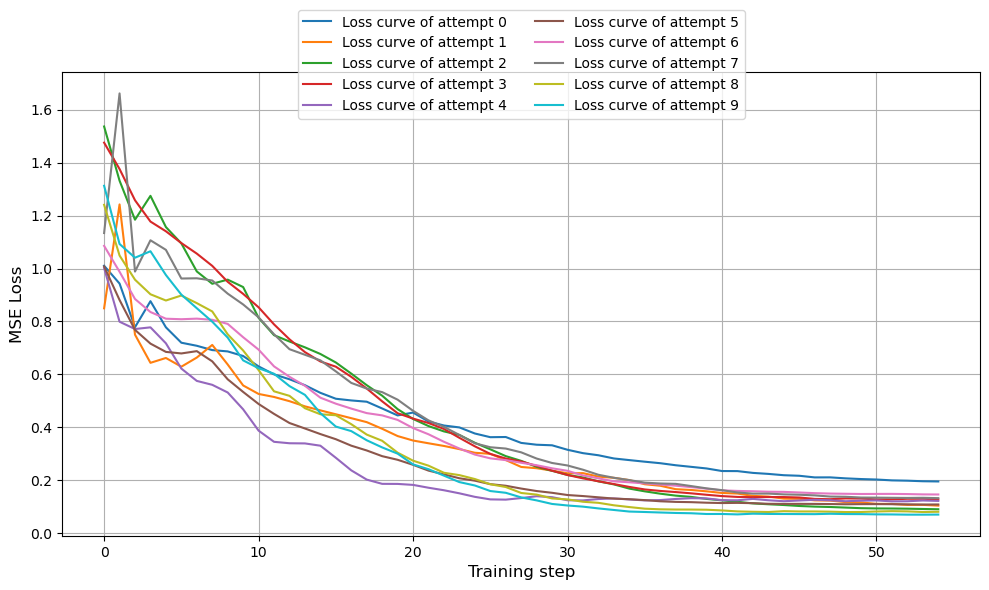

In [195]:
ev.plot_training_loss_curves(regression_exponential_results_4['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [197]:
ev.summarize_test_errors(regression_exponential_results_4['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,16.205367876564797
median,15.4560163820478
min,12.759437422146574
max,22.223550268225644
std,2.689760724820748


**Absolute distances error distribution for test points across attempts**

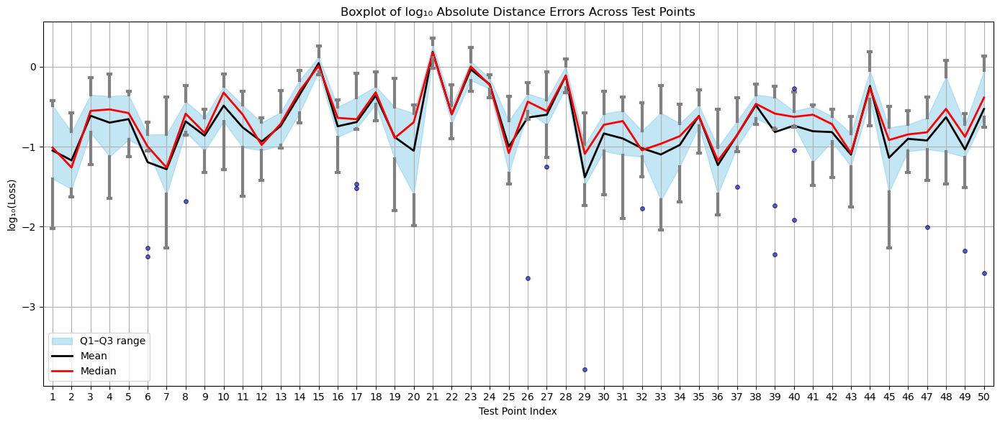

In [199]:
ev.plot_test_error_distribution(regression_exponential_results_4['local_test_errors'])

#### Model 6: GFCF-Flex-1

**Evolution of (MSE) training loss**

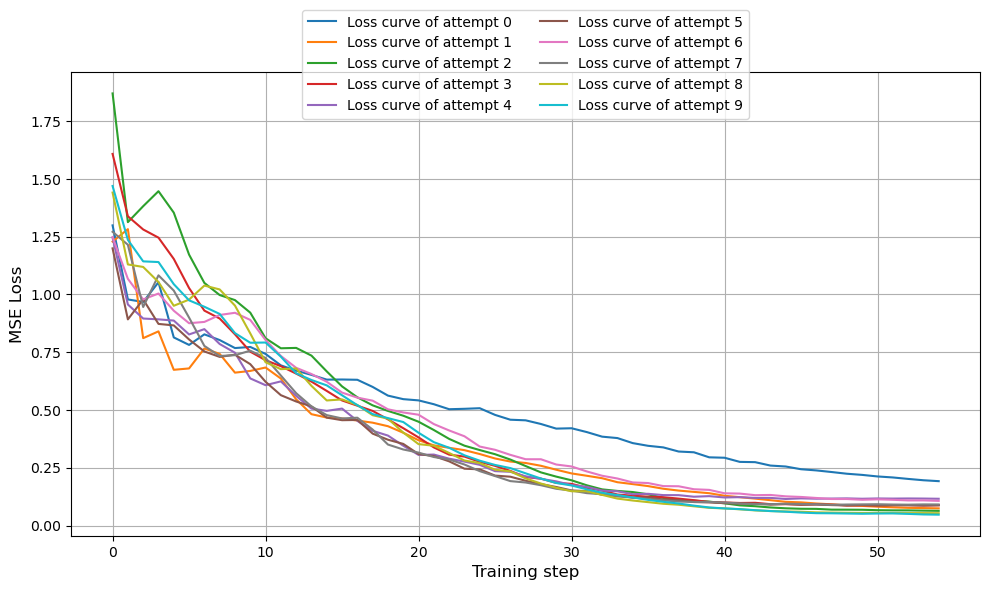

In [202]:
ev.plot_training_loss_curves(regression_exponential_results_5['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [204]:
ev.summarize_test_errors(regression_exponential_results_5['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,14.011863561506686
median,13.244983346353209
min,9.988581247086858
max,20.315392333325633
std,3.2461355449887592


**Absolute distances error distribution for test points across attempts**

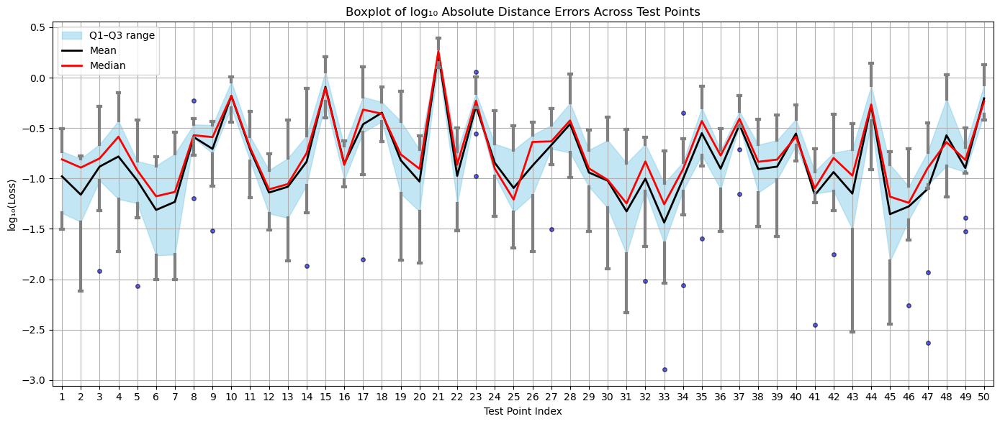

In [206]:
ev.plot_test_error_distribution(regression_exponential_results_5['local_test_errors'])

#### Exponential Regression results - Summary

In [210]:
test_error_lists_regression_exponential = [
    regression_exponential_results_0['global_test_errors'],
    regression_exponential_results_1['global_test_errors'],
    regression_exponential_results_2['global_test_errors'],
    regression_exponential_results_3['global_test_errors'],
    regression_exponential_results_4['global_test_errors'],
    regression_exponential_results_5['global_test_errors'],
]

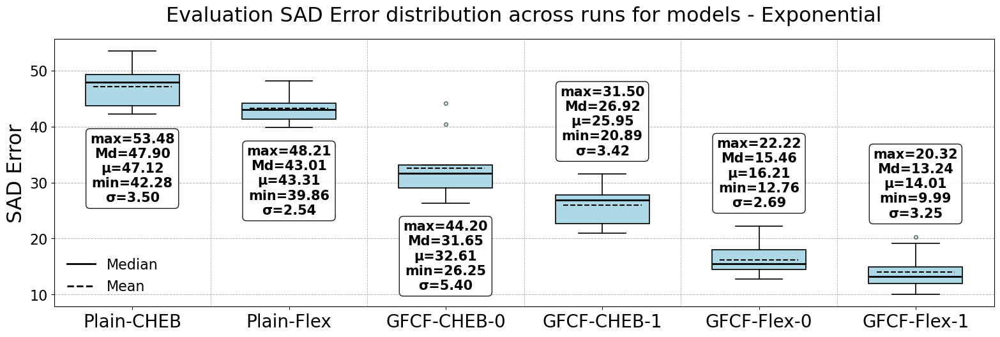

In [211]:
ev.plot_error_summary(test_error_lists_regression_exponential, model_names, 'exponential', y_label="SAD Error", title="Evaluation SAD Error distribution across runs for models - Exponential", output_path="exponential_test_error_distro.pdf")

#### Exponential Regression Training Time Statistics

**Model's training time per attempt**

In [214]:
exponential_attempt_times_per_model = []
for i in range(len(model_names)):
    var_name = f"regression_exponential_results_{i}"
    results = globals()[var_name]['time_per_attempt']
    exponential_attempt_times_per_model.append(results)

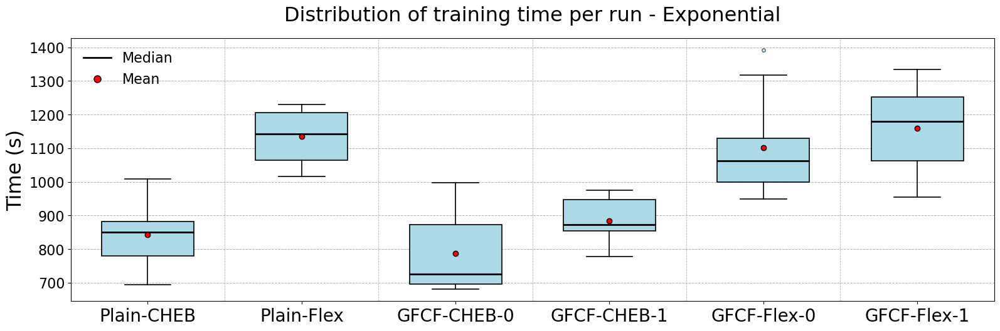

,Mean,Median,Std,Min,Max
Model,,,,,
GFCF-CHEB-0,787.74,725.47,122.30,681.04,997.26
GFCF-CHEB-1,884.34,872.67,70.30,778.78,975.47
GFCF-Flex-0,1101.39,1062.50,145.79,949.73,1391.35
GFCF-Flex-1,1159.69,1180.27,135.00,955.32,1334.98
Plain-CHEB,843.63,850.74,92.69,693.76,1008.10
Plain-Flex,1136.16,1143.17,82.29,1016.24,1230.41


In [215]:
ev.plot_training_time_boxplots(classification_attempt_times_per_model, model_names, title='Distribution of training time per run - Exponential', y_label='Time (s)', output_path="exponential_training_time_summary.pdf", show_stats=True)

**Total Training time per model**

In [217]:
exponential_total_training_times = ev.summarize_total_training_time(exponential_attempt_times_per_model, model_names)

Model,Total Training Time (s)
Plain-CHEB,6807.450000
Plain-Flex,7862.300000
GFCF-CHEB-0,7162.130000
GFCF-CHEB-1,8001.570000
GFCF-Flex-0,9422.360000
GFCF-Flex-1,10554.450000


### Task 3: Polynomial Regression

#### Model 1: Plain-CHEB

**Evolution of (MSE) training loss**

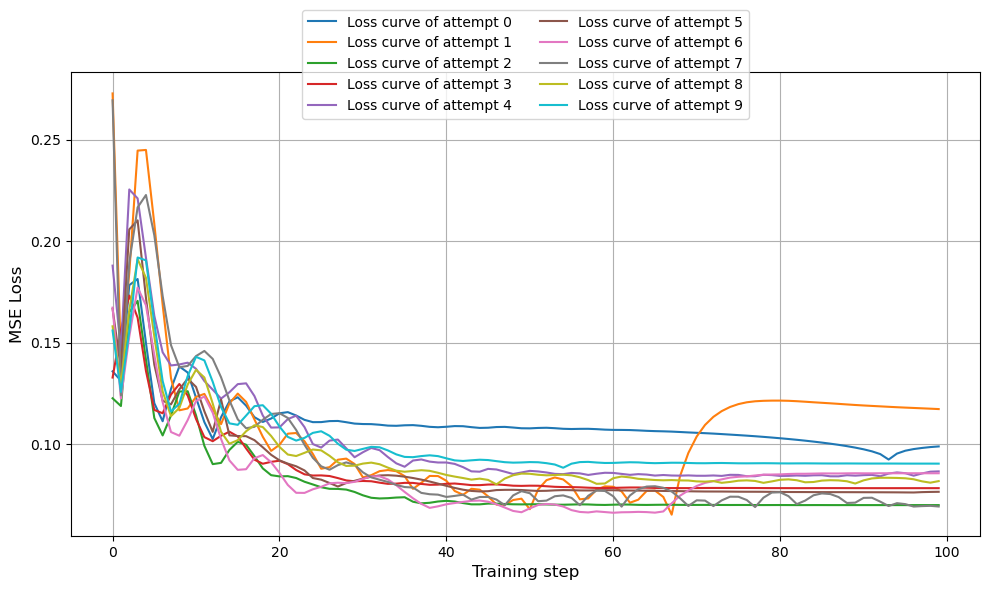

In [224]:
ev.plot_training_loss_curves(regression_polynomial_results_0['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [226]:
ev.summarize_test_errors(regression_polynomial_results_0['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,12.016125955359158
median,12.001600559339305
min,10.448181999115693
max,13.607980310884125
std,0.9471962130865378


**Absolute distances error distribution for test points across attempts**

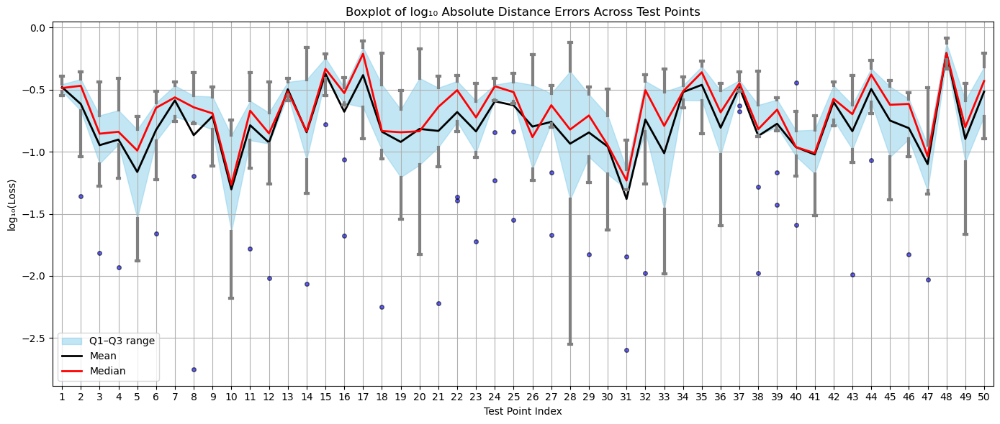

In [228]:
ev.plot_test_error_distribution(regression_polynomial_results_0['local_test_errors'])

**True vs predicted**

In [230]:
ev.plot_actual_vs_predicted(regression_polynomial_results_0['test_data'], regression_polynomial_results_0['test_data'], regression_polynomial_results_0['test_preds'], regression_polynomial_results_0['global_test_errors'])

#### Model 2: Plain-Flex

**Evolution of (MSE) training loss**

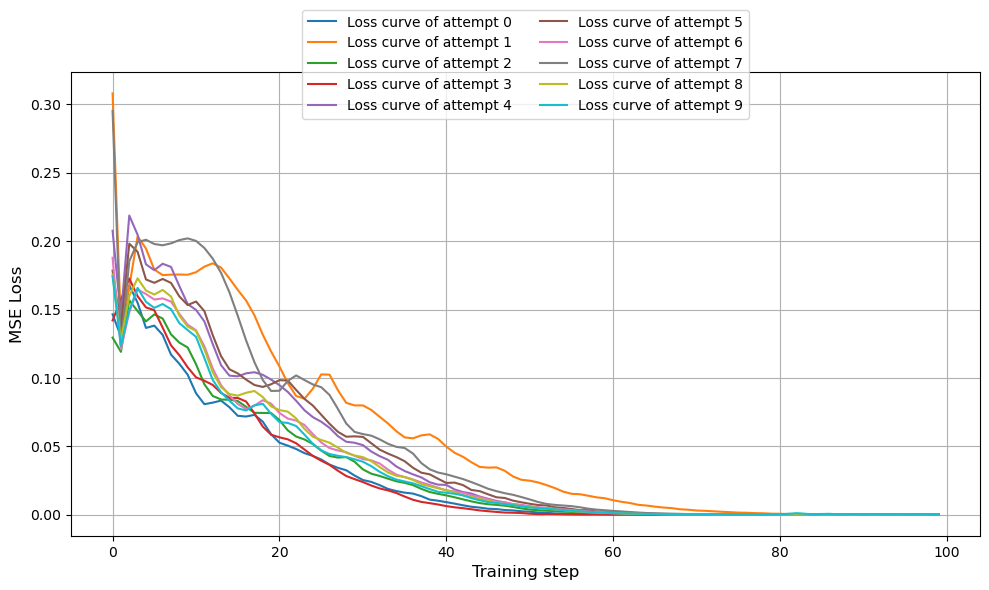

In [233]:
ev.plot_training_loss_curves(regression_polynomial_results_1['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [235]:
ev.summarize_test_errors(regression_polynomial_results_1['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,0.17307678150048406
median,0.1337617378064763
min,0.09198408891012802
max,0.40067080018888535
std,0.09584841056515228


**Absolute distances error distribution for test points across attempts**

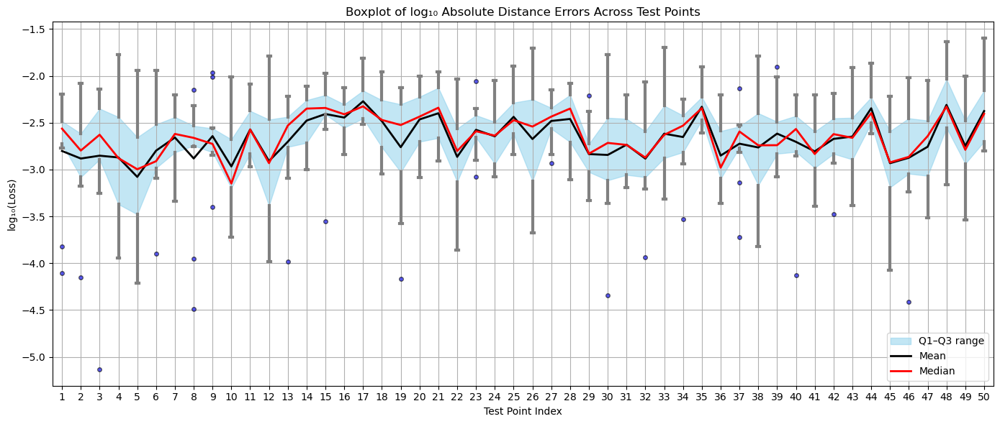

In [237]:
ev.plot_test_error_distribution(regression_polynomial_results_1['local_test_errors'])

**True vs predicted**

In [239]:
ev.plot_actual_vs_predicted(regression_polynomial_results_1['test_data'], regression_polynomial_results_1['test_data'], regression_polynomial_results_1['test_preds'], regression_polynomial_results_1['global_test_errors'])

#### Model 3: GFCF-CHEB-0

**Evolution of (MSE) training loss**

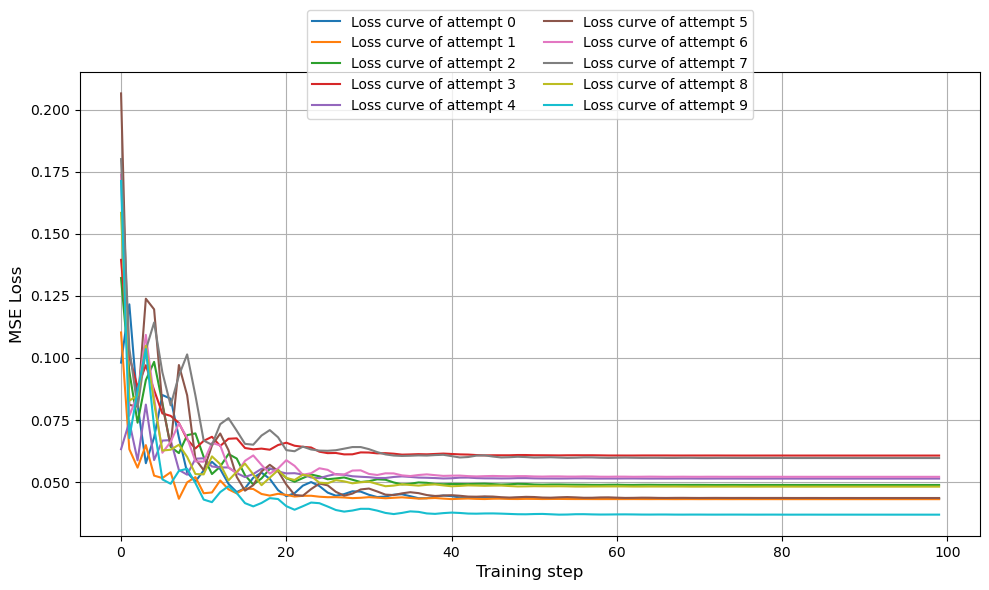

In [242]:
ev.plot_training_loss_curves(regression_polynomial_results_2['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [244]:
ev.summarize_test_errors(regression_polynomial_results_2['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,9.616161553081508
median,9.384212726874551
min,8.300782669579897
max,11.662584267173845
std,1.0148049546703688


**Absolute distances error distribution for test points across attempts**

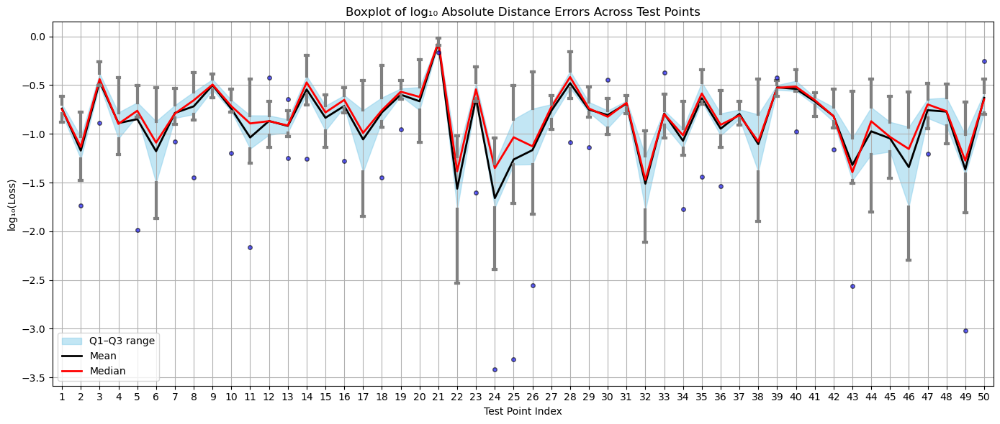

In [246]:
ev.plot_test_error_distribution(regression_polynomial_results_2['local_test_errors'])

**True vs predicted**

In [248]:
ev.plot_actual_vs_predicted(regression_polynomial_results_2['test_data'], regression_polynomial_results_2['test_data'], regression_polynomial_results_2['test_preds'], regression_polynomial_results_2['global_test_errors'])

#### Model 4: GFCF-CHEB-1

**Evolution of (MSE) training loss**

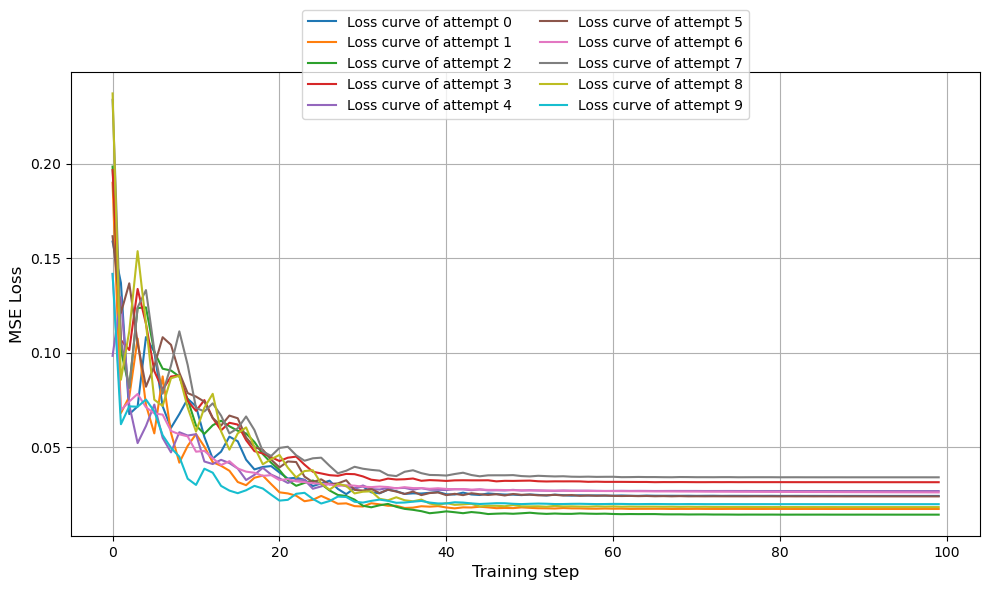

In [252]:
ev.plot_training_loss_curves(regression_polynomial_results_3['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [254]:
ev.summarize_test_errors(regression_polynomial_results_3['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,6.755179772768164
median,6.585848211227446
min,6.272680579506764
max,7.861104907094009
std,0.48630389067290236


**Absolute distances error distribution for test points across attempts**

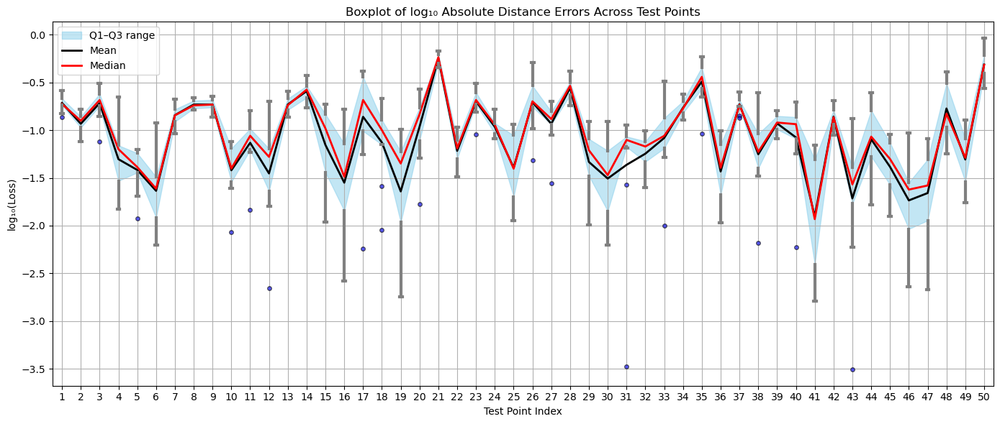

In [256]:
ev.plot_test_error_distribution(regression_polynomial_results_3['local_test_errors'])

**True vs predicted**

In [258]:
ev.plot_actual_vs_predicted(regression_polynomial_results_3['test_data'], regression_polynomial_results_3['test_data'], regression_polynomial_results_3['test_preds'], regression_polynomial_results_3['global_test_errors'])

#### Model 5: GFCF-Flex-0

**Evolution of (MSE) training loss**

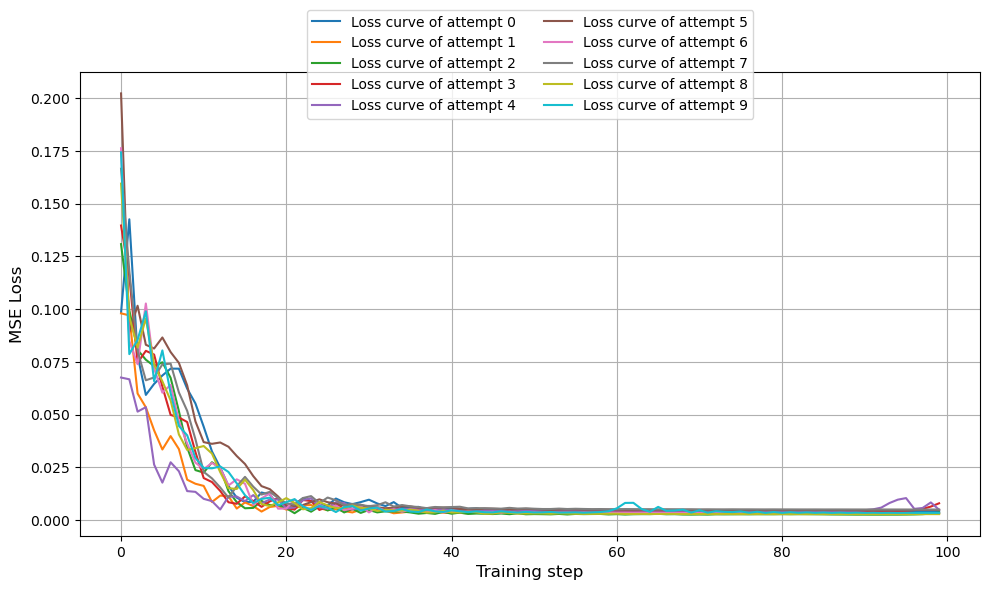

In [261]:
ev.plot_training_loss_curves(regression_polynomial_results_4['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [263]:
ev.summarize_test_errors(regression_polynomial_results_4['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,2.9024749994386565
median,2.8427778403636275
min,2.5754150532242273
max,3.3397264674269147
std,0.25240395325018083


**Absolute distances error distribution for test points across attempts**

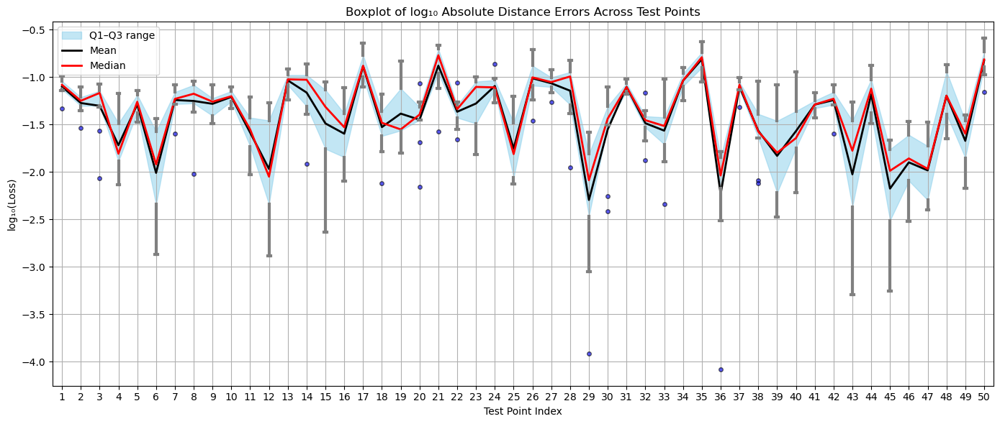

In [265]:
ev.plot_test_error_distribution(regression_polynomial_results_4['local_test_errors'])

**True vs predicted**

In [267]:
ev.plot_actual_vs_predicted(regression_polynomial_results_4['test_data'], regression_polynomial_results_4['test_data'], regression_polynomial_results_4['test_preds'], regression_polynomial_results_4['global_test_errors'])

#### Model 6: GFCF-Flex-1

**Evolution of (MSE) training loss**

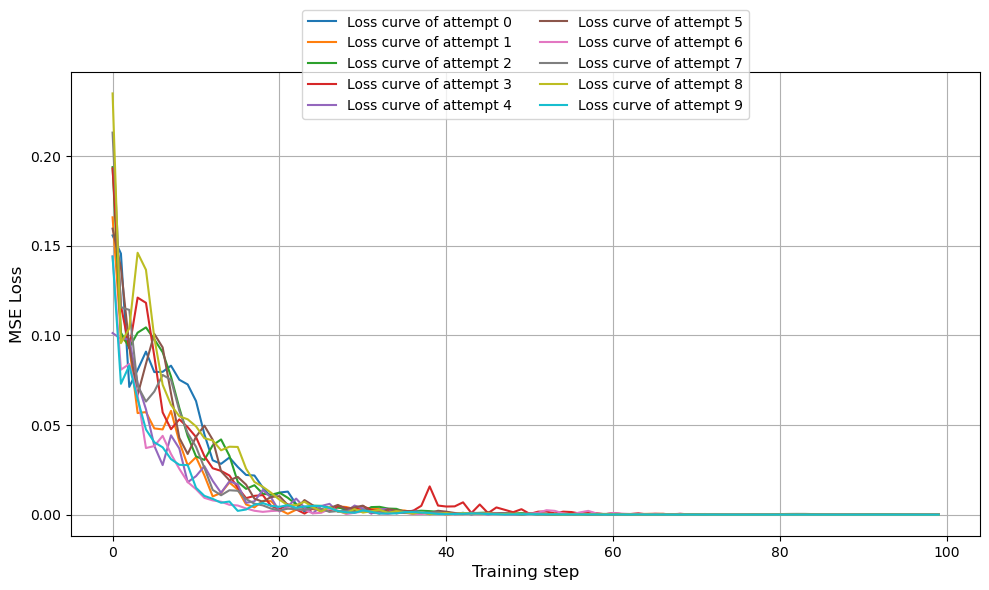

In [270]:
ev.plot_training_loss_curves(regression_polynomial_results_5['global_train_error_evolution'], 'MSE Loss')

**Statistics of the sum of absolute distances for the test datasets across attempts (main evaluation metric)**

In [272]:
ev.summarize_test_errors(regression_polynomial_results_5['global_test_errors'])

Statistic,Sum of Absolute Distances
mean,0.10260167916483398
median,0.06807016231794052
min,0.058044031803227945
max,0.21550485185478085
std,0.0579786271569027


**Absolute distances error distribution for test points across attempts**

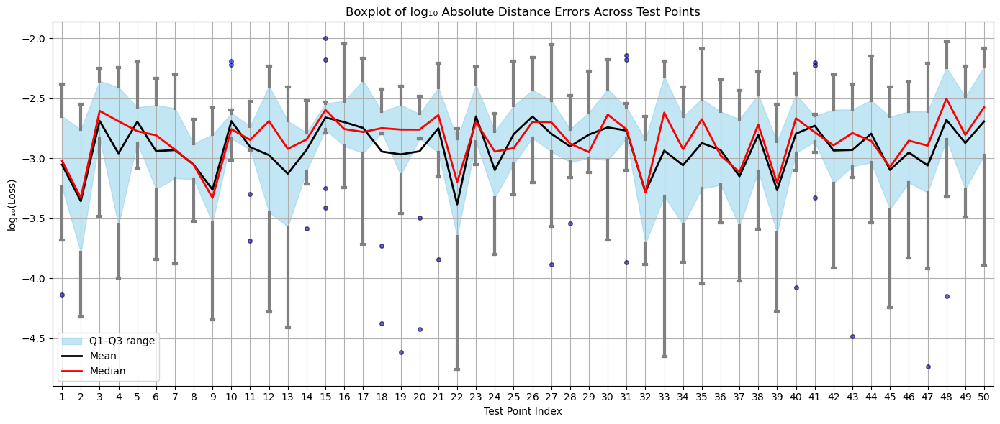

In [274]:
ev.plot_test_error_distribution(regression_polynomial_results_5['local_test_errors'])

**True vs predicted**

In [276]:
ev.plot_actual_vs_predicted(regression_polynomial_results_5['test_data'], regression_polynomial_results_5['test_data'], regression_polynomial_results_5['test_preds'], regression_polynomial_results_5['global_test_errors'])

#### Polynomial Regression results - Summary

In [283]:
test_error_lists_regression_polynomial = [
    regression_polynomial_results_0['global_test_errors'],
    regression_polynomial_results_1['global_test_errors'],
    regression_polynomial_results_2['global_test_errors'],
    regression_polynomial_results_3['global_test_errors'],
    regression_polynomial_results_4['global_test_errors'],
    regression_polynomial_results_5['global_test_errors'],
]

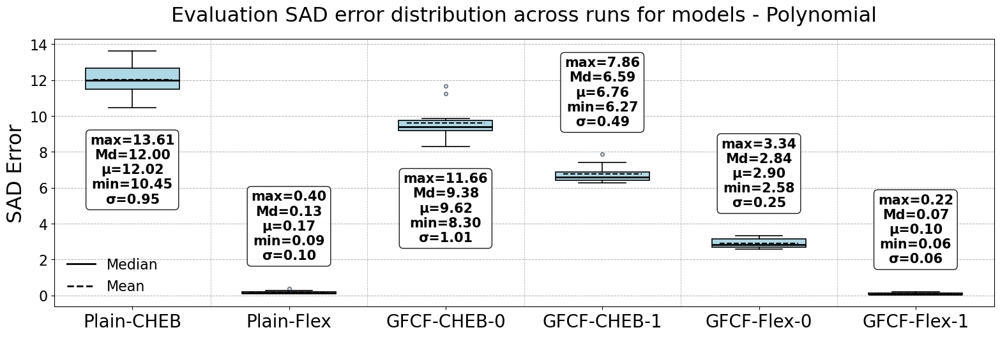

In [284]:
ev.plot_error_summary(test_error_lists_regression_polynomial, model_names, 'polynomial', y_label="SAD Error", title="Evaluation SAD error distribution across runs for models - Polynomial", output_path="polynomial_test_error_distro.pdf")

#### Polynomial Regression Training Time statistics

**Model's training time per attempt**

In [289]:
polynomial_attempt_times_per_model = []
for i in range(len(model_names)):
    var_name = f"regression_polynomial_results_{i}"
    results = globals()[var_name]['time_per_attempt']
    polynomial_attempt_times_per_model.append(results)

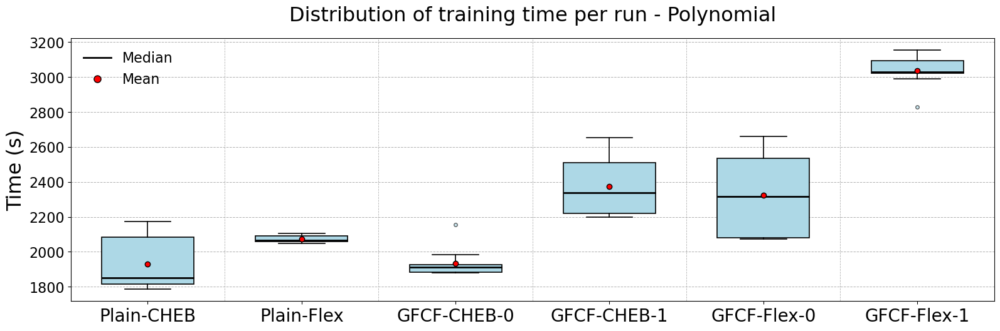

,Mean,Median,Std,Min,Max
Model,,,,,
GFCF-CHEB-0,1933.52,1910.77,83.61,1880.24,2154.33
GFCF-CHEB-1,2375.62,2338.51,171.07,2200.31,2652.69
GFCF-Flex-0,2324.97,2315.89,256.20,2071.77,2660.38
GFCF-Flex-1,3037.14,3031.23,90.53,2830.77,3153.80
Plain-CHEB,1930.74,1850.38,160.91,1786.20,2175.38
Plain-Flex,2072.89,2066.55,20.71,2048.75,2105.85


In [290]:
ev.plot_training_time_boxplots(polynomial_attempt_times_per_model, model_names, title='Distribution of training time per run - Polynomial', y_label='Time (s)', output_path="polynomial_training_time_summary.pdf", show_stats=True)

**Total Training time per model**

In [292]:
polynomial_total_training_times = ev.summarize_total_training_time(polynomial_attempt_times_per_model, model_names)

Model,Total Training Time (s)
Plain-CHEB,19307.390000
Plain-Flex,20728.910000
GFCF-CHEB-0,19335.180000
GFCF-CHEB-1,23756.220000
GFCF-Flex-0,23249.740000
GFCF-Flex-1,30371.410000


## Time statistics heatmaps across tasks

In [294]:
task_time_data_dict = {
    "Classification": classification_total_training_times,
    "Exponential Regression": exponential_total_training_times,
    "Polynomial Regression": polynomial_total_training_times
}

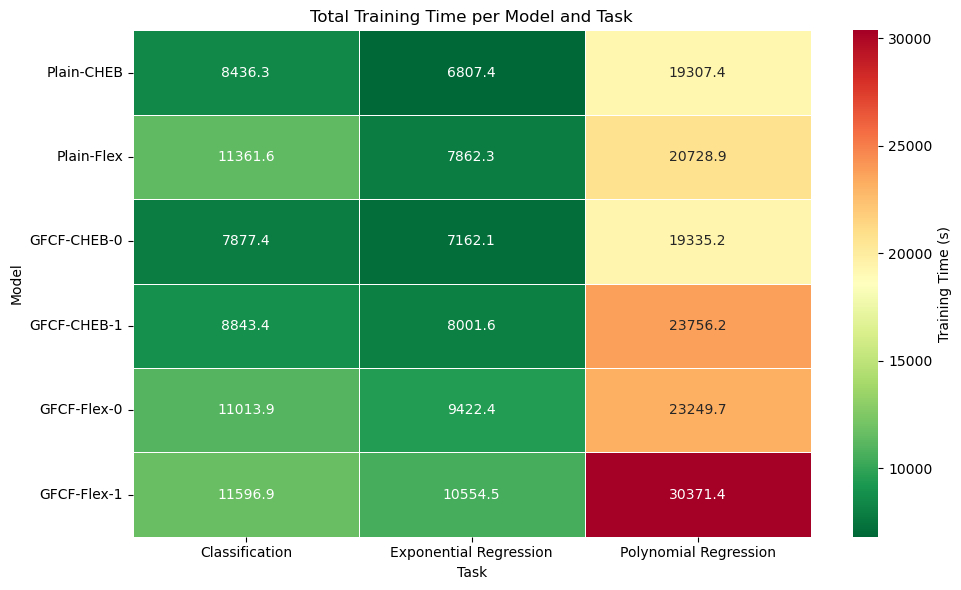

In [295]:
ev.plot_overall_training_heatmap(task_time_data_dict)

Polynomial regression task utilizes 100 training points whereas Exponential regression task uses just 50

## Resource consumption of CCQKAN models

Growth of gates number is equivalent to the time complexity.

### Expanding in architecture width

200 QKAN architectures are shown

Architectures are as follows:

[i, 1] with i ranging from 2 to 200

maximum degree is set to 2

**GFCF IS SET TO FALSE** for this graphs since it does not affect resource consumption. Using GFCF only adds an extra parameter if $\alpha$ is made learnable. That's all.

Both CHEB and Flex models are tested here.

In [300]:
architectures_width = []
max_degrees_width = []
for i in range(2, 201):
    architectures_width.append([i, 2, 1])
    max_degrees_width.append(2)

**Circuit Depth**

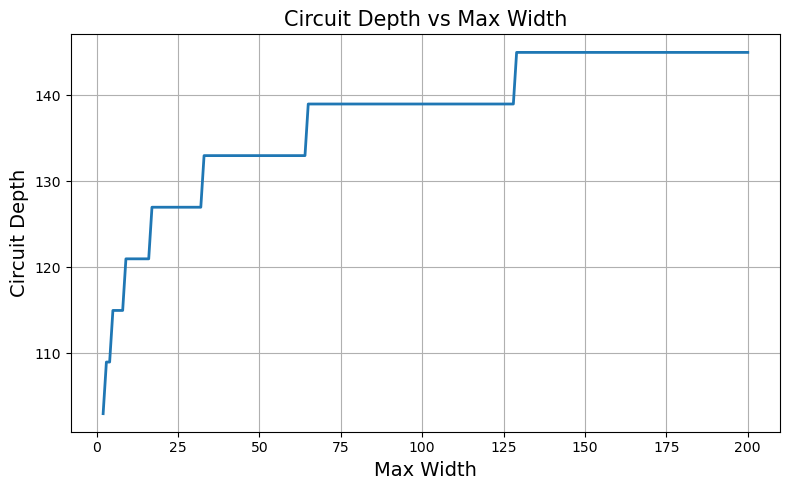

In [304]:
ev.plot_architecture_scaling(architectures_width, max_degrees_width, False, False, False, x_metric='max_width', y_metric='circuit depth', output_path='depth_width.pdf')

sub-linear!!  :=)

**Number of Gates**

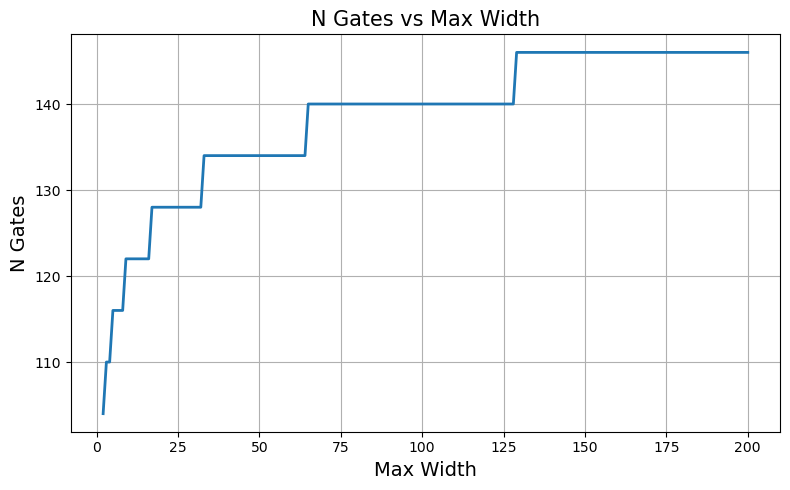

In [307]:
ev.plot_architecture_scaling(architectures_width, max_degrees_width, False, False, False, x_metric='max_width', y_metric='n_gates', output_path='gates_width.pdf')

**Number of Qubits**

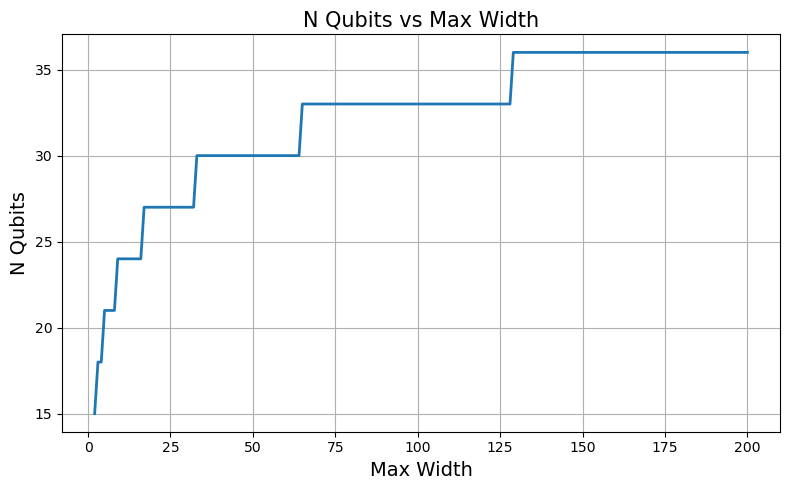

In [309]:
ev.plot_architecture_scaling(architectures_width, max_degrees_width, False, False, False, x_metric='max_width', y_metric='n_qubits', output_path='qubits_width.pdf')

**Number of Trainable Parameters for CHEB models**

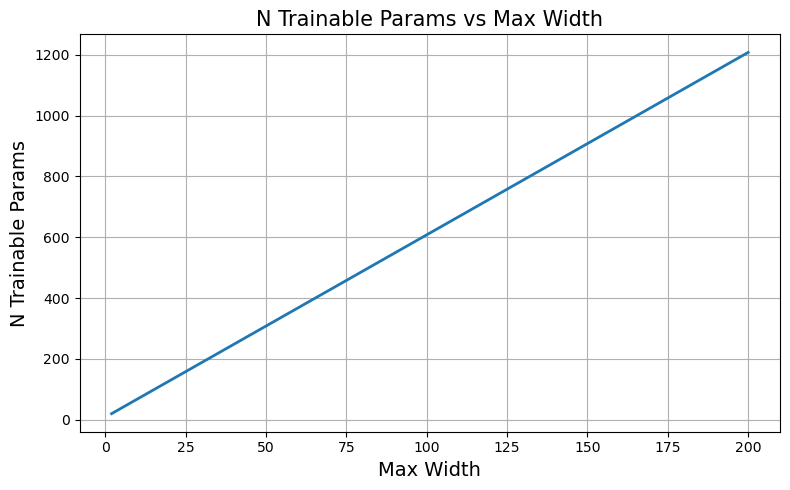

In [311]:
ev.plot_architecture_scaling(architectures_width, max_degrees_width, False, False, False, x_metric='max_width', y_metric='n_trainable_params', output_path='trainable_params_cheb_width.pdf')

**Number of Quantum Trainable Parameters for Flex models**

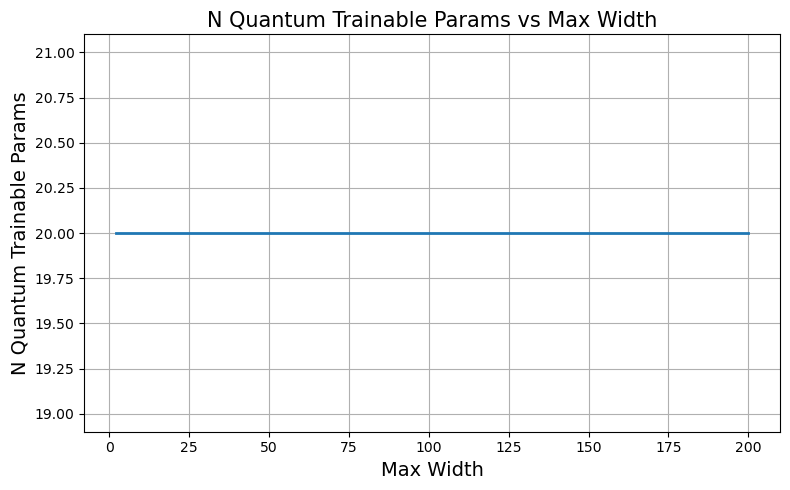

In [314]:
ev.plot_architecture_scaling(architectures_width, max_degrees_width, False, False, True, x_metric='max_width', y_metric='n_quantum_trainable_params', output_path='trainable_qparams_flex_width.pdf')

Introducing trainable QSVT angles, allways adds 20 trainable parameters.

**Number of Trainable Parameters in Flex models**

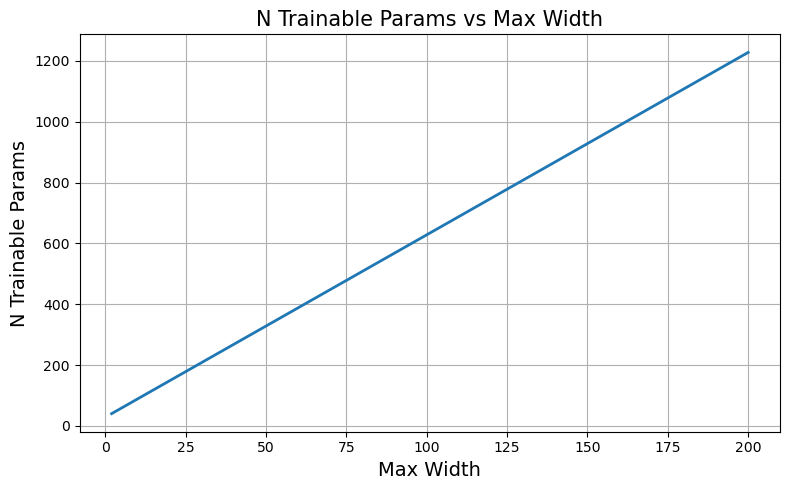

In [317]:
ev.plot_architecture_scaling(architectures_width, max_degrees_width, False, False, True, x_metric='max_width', y_metric='n_trainable_params', output_path='trainable_params_flex_width.pdf')

### Expanding in architecture depth

200 QKAN architectures are shown

Architectures are as follows:

[2] * i with i ranging from 2 to 200 which yields -> [2,2], [2,2,2] ...

maximum degree is set to 2

**GFCF IS SET TO FALSE** for this graphs since it does not affect resource consumption. Using GFCF only adds an extra parameter if $\alpha$ is made learnable. That's all.

Both CHEB and Flex models are tested here.

In [320]:
architectures_depth = []
max_degrees_depth = []
for i in range(1, 9):
    architectures_depth.append([2] + [1]*i)
    max_degrees_depth.append(2)

**Circuit Depth**

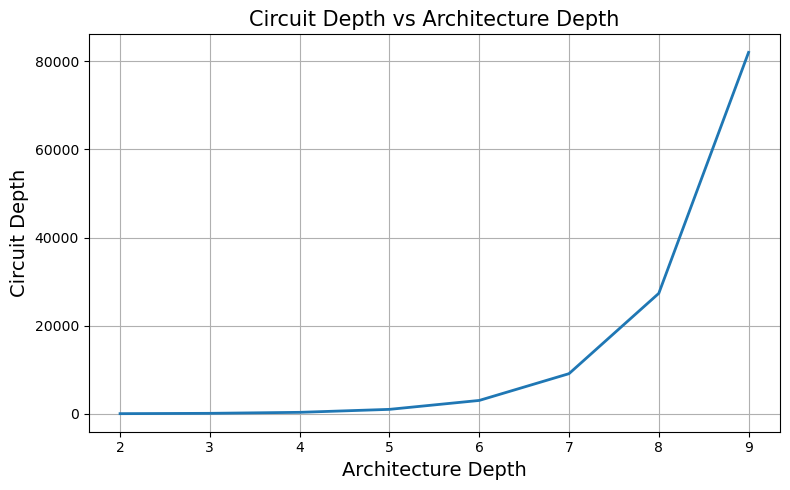

In [322]:
ev.plot_architecture_scaling(architectures_depth, max_degrees_depth, False, False, False, x_metric='architecture_depth', y_metric='circuit depth', output_path='depth_depth.pdf')

Exponential as stated in QKAN paper :=(

**Number of Gates**

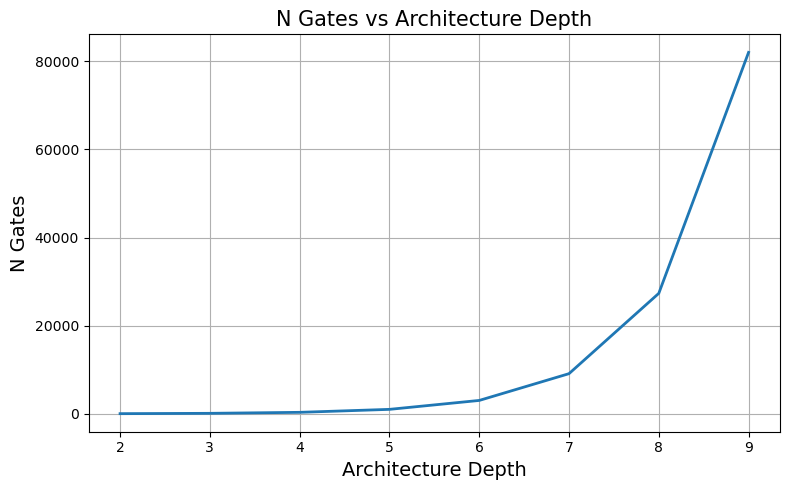

In [325]:
ev.plot_architecture_scaling(architectures_depth, max_degrees_depth, False, False, False, x_metric='architecture_depth', y_metric='n_gates', output_path='gates_depth.pdf')

**Number of Qubits**

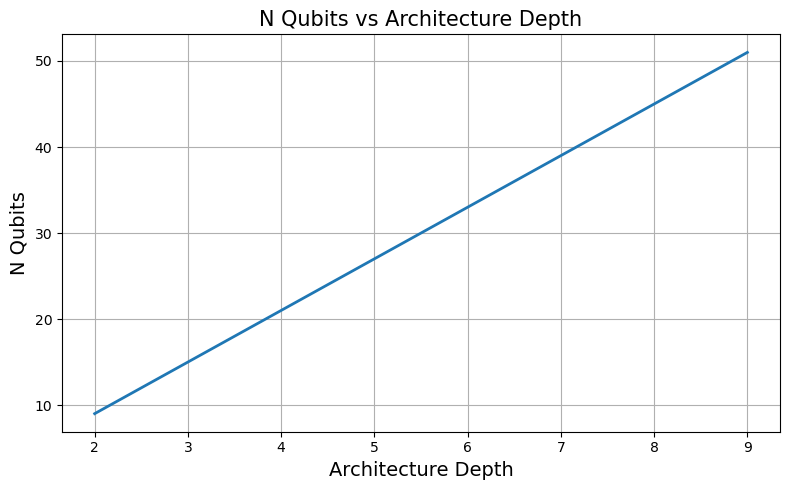

In [327]:
ev.plot_architecture_scaling(architectures_depth, max_degrees_depth, False, False, False, x_metric='architecture_depth', y_metric='n_qubits', output_path='qubits_depth.pdf')

Linear as stated in QKAN paper [1] :=)

**Number of Trainable Parameters for CHEB models**

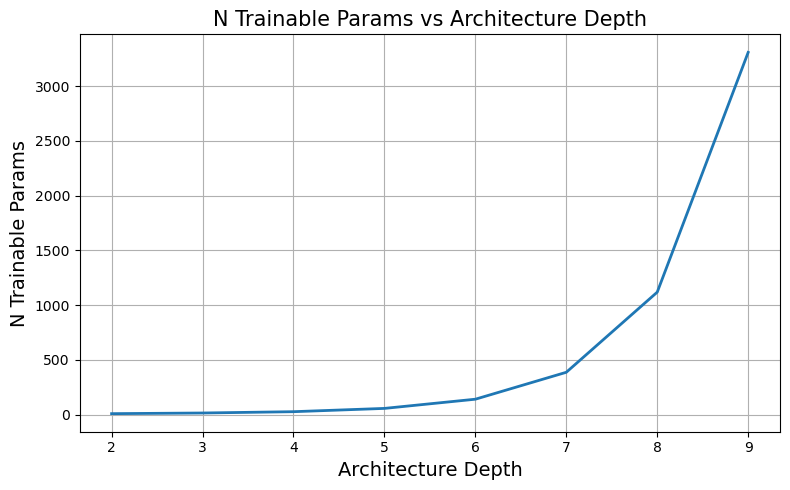

In [330]:
ev.plot_architecture_scaling(architectures_depth, max_degrees_depth, False, False, False, x_metric='architecture_depth', y_metric='n_trainable_params', output_path='trainable_params_cheb_depth.pdf')

**Number of Quantum Trainable Parameters for Flex models**

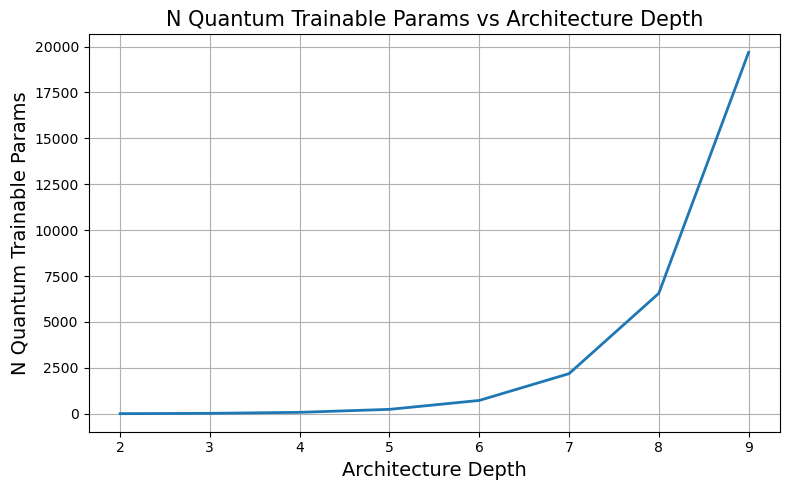

In [333]:
ev.plot_architecture_scaling(architectures_depth, max_degrees_depth, False, False, True, x_metric='architecture_depth', y_metric='n_quantum_trainable_params', output_path='trainable_qparams_flex_depth.pdf')

**Number of Trainable Parameters for Flex models**

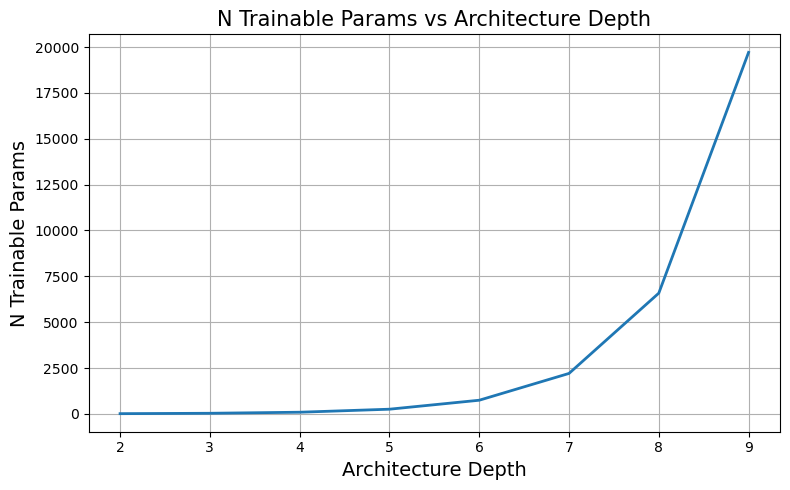

In [335]:
ev.plot_architecture_scaling(architectures_depth, max_degrees_depth, False, False, True, x_metric='architecture_depth', y_metric='n_trainable_params', output_path='trainable_params_flex_depth.pdf')

### Expanding in maximum degree

200 QKAN architectures are shown

Architectures are as follows:

architecture is set to [2,1]

maximum degrees range from 1 to 10

**GFCF IS SET TO FALSE** for this graphs since it does not affect resource consumption. Using GFCF only adds an extra parameter if $\alpha$ is made learnable. That's all.

Both CHEB and Flex models are tested here.

In [338]:
architectures_degree = []
max_degrees_degree = []
for i in range(1, 71):
    architectures_degree.append([2,1])
    max_degrees_degree.append(i)

**Circuit Depth**

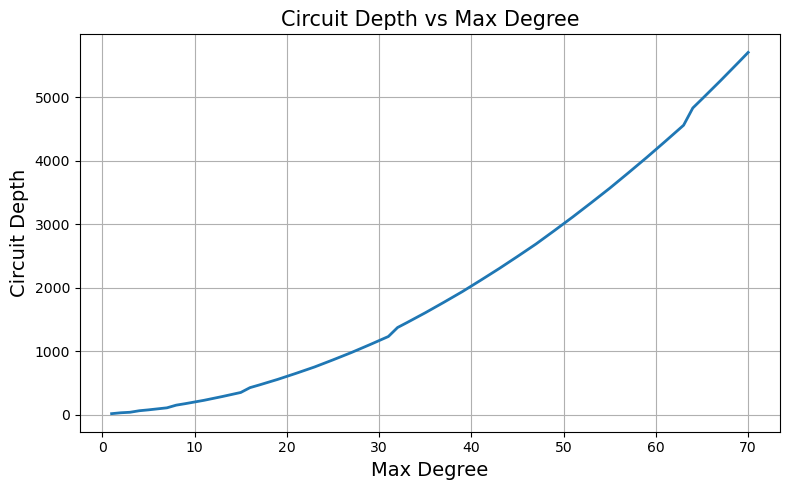

In [340]:
ev.plot_architecture_scaling(architectures_degree, max_degrees_degree, False, False, False, x_metric='max_degree', y_metric='circuit depth', output_path='depth_degree.pdf')

**Number of Gates**

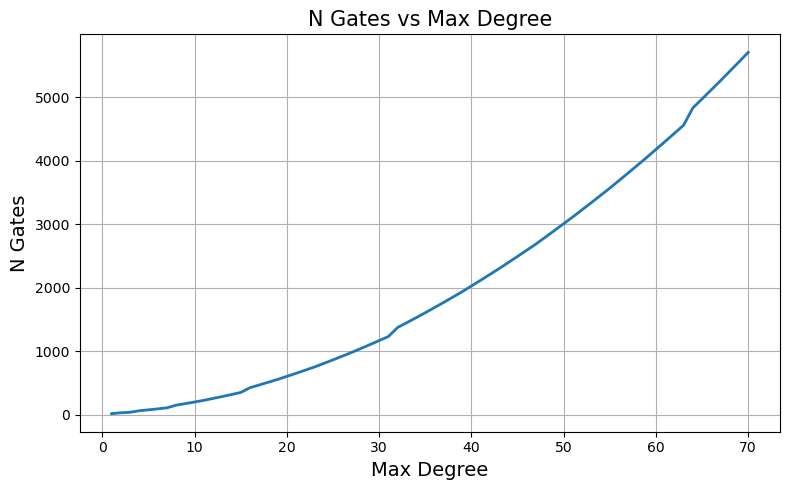

In [342]:
ev.plot_architecture_scaling(architectures_degree, max_degrees_degree, False, False, False, x_metric='max_degree', y_metric='n_gates', output_path='gates_degree.pdf')

**Number of Qubits**

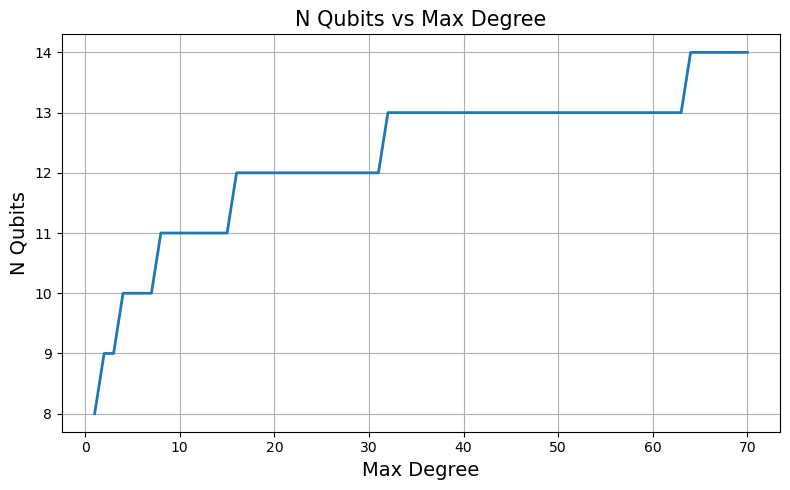

In [344]:
ev.plot_architecture_scaling(architectures_degree, max_degrees_degree, False, False, False, x_metric='max_degree', y_metric='n_qubits', output_path='qubits_degree.pdf')

Sublinear!!! :=)

**Number of Trainable Parameters for CHEB models**

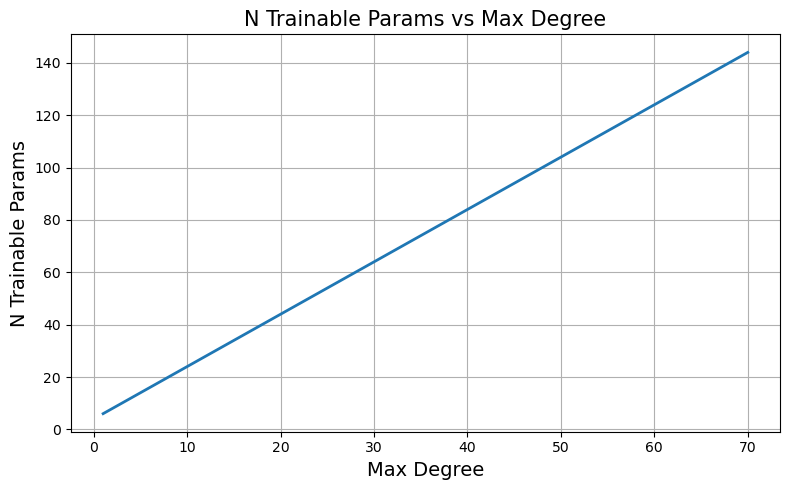

In [348]:
ev.plot_architecture_scaling(architectures_degree, max_degrees_degree, False, False, False, x_metric='max_degree', y_metric='n_trainable_params', output_path='trainable_params_cheb_degree.pdf')

**Number of Quantum Trainable Parameters for Flex models**

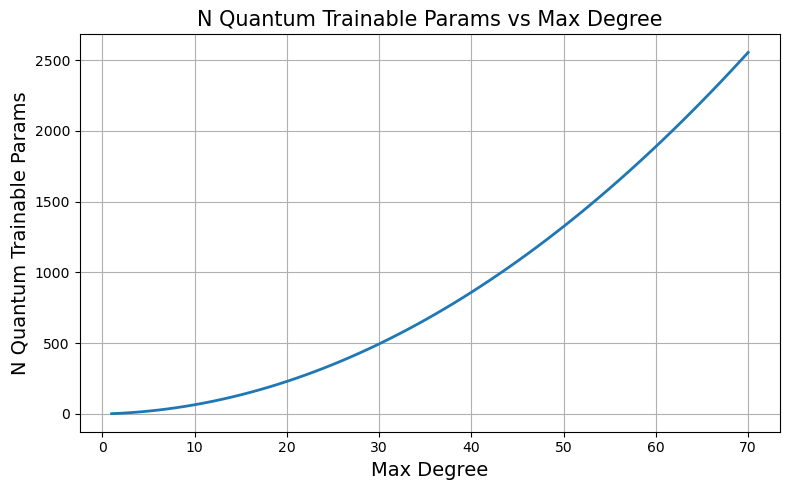

In [350]:
ev.plot_architecture_scaling(architectures_degree, max_degrees_degree, False, False, True, x_metric='max_degree', y_metric='n_quantum_trainable_params', output_path='trainable_qparams_flex_degree.pdf')

**Number of Trainable Parameters for Flex models**

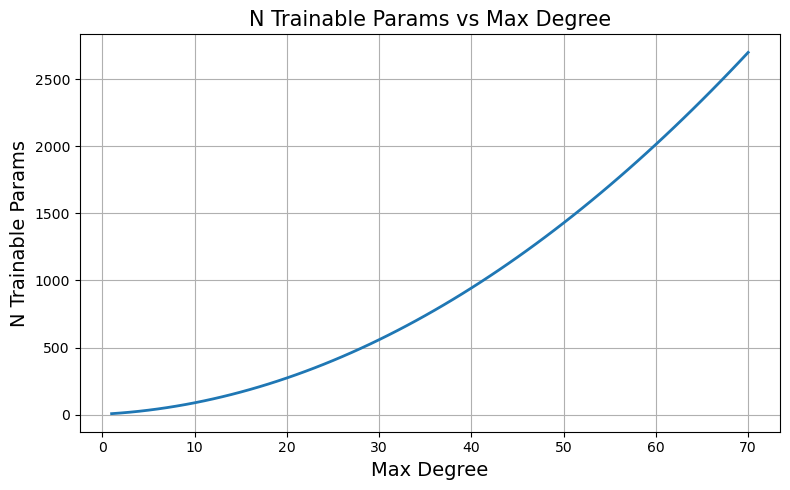

In [352]:
ev.plot_architecture_scaling(architectures_degree, max_degrees_degree, False, False, True, x_metric='max_degree', y_metric='n_trainable_params', output_path='trainable_params_flex_degree.pdf')

## References

[1] Petr Ivashkov, Po-Wei Huang, Kelvin Koor, Lirand¨e Pira, and Patrick Reben-
trost. Qkan: Quantum kolmogorov-arnold networks, 2024.

[2] Kourosh Parand and Mehdi Delkhosh. In: Nonlinear Engineering 6.3 (2017), pp. 229–240. doi: doi:10.1515/nleng-
2017-0030. url: https://doi.org/10.1515/nleng-2017-0030.


[3] Hikaru Wakaura and Andriyan B. Suksmono. The quantum version of
kolmogorov-arnold network (kan): Variational quantum kolmogorov-arnold
network, June 2024. Preprint, Version 1, available at Research Square.

[4] Hikaru Wakaura, Rahmat Mulyawan, and Andriyan B. Suksmono. Adaptive
variational quantum kolmogorov-arnold network, 2025.

[5] Hikaru Wakaura, Rahmat Mulyawan, and Andriyan B. Suksmono. Enhanced
variational quantum kolmogorov-arnold network, 2025.